# Media Spend Cost Optimization

### <u>Team</u>
Our team members are:

&emsp; Aditya Sanjay Pawar: https://github.com/aspawarsyredu

&emsp;    Himanshu Hegde: https://github.com/himanshu-hegde-syr

&emsp;    Keerthi Krishna Aiyappan: https://github.com/KeerthiKrishna-Aiyappan

&emsp;    Sri Venkata Subhramanya Abhishek Namana: https://github.com/snamana 

&emsp;    Point of Contact: Himanshu Hegde

### <u>Overview</u>
Context
Marketing Mix Model, or Media Mix Model (MMM) is used by companies to measure how their media spending(TV, social media, email, newspapers etc.) contributes to sales, so as to optimize future budget allocation. Companies nowadays are investing millions of dollars into offline and online marketing channels to drive customer acquisition and sales. As the number of media channels increases, it gets harder and harder to track, analyze and quantify the impact of their marketing spend. The sale of a product is influenced by various factors:

- Brand image

- Product distribution

- Product pricing

- Offline and online media spend

- Competitor pricing and media spend

- Discounts and promotions

- Seasonality

- External economic factors

When you have multiple factors affecting the demand for your product, it is crucial to understand and be able to quantify how each media channel you spend on (TV, social media, email, newspapers etc.) impacts your demand. This understanding is all the more essential while optimizing the budget for company media spend, by allocating spend across different media channels efficiently.

#### <u>What we are doing to solve this</u>
The solution we are proposing involves using Bayesian and Shapley based approaches to understand the marginal(individual) contribution of each media channel to sales, the diminishing effect media spend has, ad-stock lag effect of each media channel and the cost saved by optimizing media spend.

#### <u>Our goal is to:</u>

Understand the effectiveness of different media channels in driving product sales.

Quantify Ad-Stock effect of various media channels. Ad-stock is the lagged effect between advertisement launch and consumer purchase.

Assess the Diminishing Returns of each media channel. After a certain saturation point, increasing media spend will not result in increased product sales (i.e. it will result in diminishing sales returns).
Optimize future marketing decisions and quantify its impact. Once we have a clear understanding on the marginal impacts of each of the media channels, we can optimize our media spends given a certain budget.

#### <u>What is new in our approach?</u>

Traditional MMM models over the years have been built using Generalized Linear models and Bayesian Statistics. Over the past few years, Shapley(Shapley Additive exPlanations) based approaches have been highly used across different domains for calculating marginal contributions of different features of a non-linear model to the target variable. However, they have not been implemented across many MMM models. We intend to explore using Shapley to understand the relationship and impact of each of the media channels towards product demand and compare these insights to ones obtained by traditional methods.

#### <u>If you are successful, what difference will it make?</u>

A successful model will result in an optimized media allocation budget and strategy, which in turn will increase demand for products, yield more revenue and help reduce unnecessary spending. Some examples of the insights are:

TV ads contribute to 20% of sales revenue, while social media contributes to 10% of the sales revenue.

Consumers start purchasing a product 2 weeks after TV ads, and 1 week after newspaper ads.

Increasing the social media spend for product A above $10k yields no increase in sales returns.

If we were to reduce the media spend budget to $30k, then investing $6k of this into newspaper ads, will see a 4% rise in product sales.

### <u>Data</u>

The marketing spend data belongs to a shampoo advertiser, provided by Neustar MarketShare. The data was consolidated from sources such as Kantar Media, IRI, ITG, JD Power, and Rentrak.

It contains 4 years of weekly data, including weekly volume sales in ounces and media spend on major channels such as TV, magazines, display, YouTube, and search. Also available are retailer variables such as the average price per ounce, ACV weighted product distribution, discounts, and promotions. The same dataset has been used by Yuxue Jin and Yueqing Wang, when they built a marketing solution for Google in 2017.

The columns in the data can be clubbed into 3 main categories:

- Media Variables Media Impression (prefix='mdip_'): impressions of 13 media channels: direct mail, insert, newspaper, digital audio, radio, TV, digital video, social media, online display, email, SMS, affiliates, SEM.

- Media Spending (prefix='mdsp_'): spending of media channels.

- Control Variables Macro Economy (prefix='me_'): CPI, gas price. Markdown (prefix='mrkdn_'): markdown/discount. Store Count ('st_ct') Retail Holidays (prefix='hldy_'): one-hot encoded. Seasonality (prefix='seas_'): month, with Nov and Dec further broken into to weeks. One-hot encoded.

- Target Variable Sales(‘sales’): Weekly sales in Dollars.

In [9]:
!pip install shap

  Obtaining dependency information for shap from https://files.pythonhosted.org/packages/dc/53/15b0fdb9e7285be11cf51deaf62705645651ae296d5db076dc4b6881c97b/shap-0.45.0-cp311-cp311-macosx_11_0_arm64.whl.metadata
  Obtaining dependency information for slicer==0.0.7 from https://files.pythonhosted.org/packages/78/c2/b3f55dfdb8af9812fdb9baf70cacf3b9e82e505b2bd4324d588888b81202/slicer-0.0.7-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.1/452.1 kB 10.3 MB/s eta 0:00:0000:01


In [10]:
!pip install xgboost

  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/03/e6/4aef6799badc2693548559bad5b56d56cfe89eada337c815fdfe92175250/xgboost-2.0.3-py3-none-macosx_12_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 7.3 MB/s eta 0:00:00ta 0:00:01


# <u>Preprocessing</u>

### Import required libraries

In [11]:
"""
Import required libraries

"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score,precision_score,recall_score
from sklearn.metrics import mean_absolute_percentage_error,r2_score,mean_squared_error
from sklearn.metrics import RocCurveDisplay,roc_curve,auc
from xgboost import XGBClassifier,XGBRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold
import time
from sklearn.impute import KNNImputer
from sklearn.naive_bayes import GaussianNB

from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons
from sklearn.datasets import make_classification
import re

import shap
from pprint import pprint


from IPython.display import display, HTML
display(HTML("<st yle>.container { width:80% !important; }</style>"))

pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 300)

import warnings
warnings.filterwarnings('ignore')

### Define commonly used functions

In [12]:
class data_pre_processing():
    """
    Pre process pandas dataframes
    """
    
    def df_description(df):
        print('shape : ',df.shape)
        print('dtypes :','\n',df.dtypes)
        return None

    def convert_col_names_to_lower_case(df):
        for col in df.columns:
            df = df.rename(columns = {col:col.lower()})
        return df
    
    def describe_data(df):
        display(df.describe(include='all'))
        return None
    
    def data_info(df):
        display(df.info(verbose=True, show_counts=True))
        return None

    def nulls_in_data(df):
        print(df.isnull().sum())
        return None
    
    def duplicate_rows_at_primary_key_level(df,level_of_the_data :list):
        
        df = df[df.duplicated(subset=level_of_the_data, keep=False)]
        if df.shape[0] >0:
            print(" Dataframe has duplicates, total rows with duplicates :",df.shape[0])
        else:
            print(" No duplicates in data")      
        return df
    
    def percentage_nulls_in_each_col(df):
        """
        Return a DF of total null percentage in each column
        Args:
            df (Dataframe): Input DF
        """
        NA = pd.DataFrame(data=[df.isna().sum().tolist(), ["{:.2f}".format(i)+'%' \
           for i in (df.isna().sum()/df.shape[0]*100).tolist()],df.dtypes.tolist()], 
           columns=df.columns, index=['NA Count', 'NA Percent','Dtypes']).transpose()
        display(NA)
        
        return None

        
            
    def drop_cols(df,column_list_to_drop):
        """

        Args:
            df (Dataframe): Input Dataframe
            column_list_to_drop (List of COlumns): List of columns to be dropped from DF
            
        Result :
            df with updated columns post dropping.
        """
        
        return df.drop(columns = column_list_to_drop)
    
    def df_columns_and_dtypes_into_list(df) -> dict:
        """

        Returns Dataframe columns and respcetive dtypes as a dictionary.
        Args:
            df (Dataframe): Input Dataframe

        Returns:
            dict: {col1:dtype,col2:dtype2}
        """
        
        return {df.columns.tolist()[i] : str(df.dtypes.tolist()[i]) for i in range(len(df.columns)) }
    
    
    def convert_dtypes_from_dict(df, col_to_dtype_mapping_dict : dict ):
        """
        df : Input Dataframe
        col_to_dtype_mapping_dict: {column:dtype}
        
        return : df with updated dtypes
        
        """
        print('Converting Column Datatypes')
        for col,dtype in col_to_dtype_mapping_dict.items():
            try:
                if col in df.columns:
                    if dtype == 'string':
                        df[col] = df[col].astype(str)
                    elif dtype == 'int':
                        df[col] = df[col].astype(int)
                    elif dtype == 'float':
                        df[col] = df[col].astype(float)
                    elif dtype == 'datetime':
                        df[col] = pd.to_datetime(df[col])
            except Exception as e:
                print('Error processing : ',col, ' ; ',e)
        return df
    


    def ydata_profiling(df):
        """
        Run ydata_profile library for data
        Args:
            df (Dataframe): Df to be profiled

        Returns:
            _type_: _description_
        """
        # !pip install ydata-profiling --ignore-installed llvmlite --user
        # from ydata_profiling import ProfileReport
        # or
        # !pip install ydata-profiling==4.1.2
        # !pip install pydantic==2.6.0 --user
        from ydata_profiling import ProfileReport
        profile = ProfileReport(df)
        
        return profile
    


    def process_nulls_in_df(df,null_columns)-> pd.core.frame.DataFrame:
        """_summary_

        Args:
            df (_type_): _description_
            null_columns (_type_): _description_

        Returns:
            pd.core.frame.DataFrame: _description_
        """
    

        
        return None

### Load Dataset

In [13]:
"""
Read the dataset.

Four years' (209 weeks) records of sales, media impression and media spending at weekly level.

1. Media Variables

Media Impression (prefix='mdip_'): impressions of 13 media channels: direct mail, insert, newspaper, digital audio, radio, TV, digital video, social media, online display, email, SMS, affiliates, SEM.
Media Spending (prefix='mdsp_'): spending of media channels.
2. Control Variables

Macro Economy (prefix='me_'): CPI, gas price.
Markdown (prefix='mrkdn_'): markdown/discount.
Store Count ('st_ct')
Retail Holidays (prefix='hldy_'): one-hot encoded.
Seasonality (prefix='seas_'): month, with Nov and Dec further broken into to weeks. One-hot encoded.
3. Sales Variable ('sales')

"""
    
mmm_df = pd.read_csv('/Users/USER/Downloads/data.csv')
print(mmm_df.shape)




(209, 80)


### Treat column headers - renaming,lowercasing,datatype formatting

In [14]:
"""
Define new names for columns.
Re-map column names.

"""

mmm_df2 = mmm_df.copy()

mapped_columns_dict = {'mdip_':'media_impression_',\
                        'mdsp_':'media_spend_',\
                        'me_': 'macro_econ_',\
                        'mrkdn_':'markdown_discount_',\
                        'st_ct':'store_count',\
                        'wk_strt_dt':'week_start_date',\
                        'wk_in_yr_nbr':'week_in_year',\
                        'yr_nbr':'year',\
                        'qtr_nbr':'quarter',\
                        'prd':'period',\
                        'wk_nbr':'week_in_month',\
                        '_dm':'_direct_mail',\
                        '_inst':'_insert',\
                        '_nsp':'_newspaper',\
                        '_auddig':'_dig_audio',\
                        '_audtr':'_radio',\
                        '_vidtr':'_tv',\
                        '_viddig':'_dig_video',\
                        '_so':'_social_media',\
                        '_on':'_online display',\
                        '_em':'_email',\
                        '_sms':'_sms',\
                        }

datatype_mapping = {'week_start_date':'datetime'}

# Map column names
for short_form,long_form in mapped_columns_dict.items():
    for col in mmm_df2.columns:
        if short_form in col:
            new_col_name = re.sub(short_form,long_form,col)
            # print(short_form,"--> ",col,"--> ",new_col_name)
            mmm_df2 = mmm_df2.rename(columns={col:new_col_name})


# Lowercase column names
mmm_df2 = data_pre_processing.convert_col_names_to_lower_case(mmm_df2)

# String to Date conversion
mmm_df2 = data_pre_processing.convert_dtypes_from_dict(df = mmm_df2,col_to_dtype_mapping_dict=datatype_mapping)





Converting Column Datatypes


### Define continuous,categorical(already one-hot encoded) and target columns

In [15]:
"""
Define continuous,categorical and target column

"""


continuous_column = [ 'media_impression_direct_mail', 'media_impression_insert',
       'media_impression_newspaper', 'media_impression_dig_audio',
       'media_impression_radio', 'media_impression_tv',
       'media_impression_dig_video', 'media_impression_social_media',
       'media_impression_online display', 'media_impression_email',
       'media_impression_sms', 'media_impression_aff', 'media_impression_sem',
       'media_spend_direct_mail', 'media_spend_insert',
       'media_spend_newspaper', 'media_spend_dig_audio', 'media_spend_radio',
       'media_spend_tv', 'media_spend_dig_video', 'media_spend_social_media',
       'media_spend_online display', 'media_spend_sem',
       'macro_econ_ics_all', 'macro_econ_gas_dpg', 'store_count',
       'markdown_discount_valadd_edw', 'markdown_discount_pdm']

one_hot_encoded_columns = ["hldy_black friday",
       "hldy_christmas day", "hldy_christmas eve", "hldy_columbus day",
       "hldy_cyber monday", "hldy_day after christmas", "hldy_easter",
       "hldy_father's day", "hldy_green monday", "hldy_july 4th",
       "hldy_labor day", "hldy_mlk", "hldy_memorial day", "hldy_mother's day",
       "hldy_nye", "hldy_new year's day", "hldy_pre thanksgiving",
       "hldy_presidents day", "hldy_prime day", "hldy_thanksgiving",
       "hldy_valentine's day", "hldy_veterans day", "seas_period_1",
       "seas_period_2", "seas_period_3", "seas_period_4", "seas_period_5",
       "seas_period_6", "seas_period_7", "seas_period_8", "seas_period_9",
       "seas_period_12", "seas_week_40", "seas_week_41", "seas_week_42",
       "seas_week_43", "seas_week_44", "seas_week_45", "seas_week_46",
       "seas_week_47", "seas_week_48"]

date_columns = ['week_start_date', 'year', 'quarter', 'period', 'week_in_month','week_in_year']

target_column = ["sales"]



### Missing data check

In [16]:
"""
Missing Data Check

"""

# Select Required Columns
cols_to_perform_eda = ["week_start_date","year","quarter","period","week_in_year","media_impression_direct_mail","media_impression_insert","media_impression_newspaper","media_impression_dig_audio","media_impression_radio","media_impression_tv","media_impression_dig_video","media_impression_social_media","media_impression_online display","media_impression_email","media_impression_sms","media_impression_aff","media_impression_sem","media_spend_direct_mail","media_spend_insert","media_spend_newspaper","media_spend_dig_audio","media_spend_radio","media_spend_tv","media_spend_dig_video","media_spend_social_media","media_spend_online display","media_spend_sem","sales","macro_econ_ics_all","macro_econ_gas_dpg","store_count","markdown_discount_valadd_edw","markdown_discount_pdm","hldy_black friday","hldy_christmas day","hldy_christmas eve","hldy_cyber monday","hldy_day after christmas","hldy_pre thanksgiving","hldy_prime day","hldy_thanksgiving",]

mmm_df3 = mmm_df2.copy()

mmm_df3 = mmm_df3[cols_to_perform_eda].reset_index(drop=True)

data_null_percentage = data_pre_processing.percentage_nulls_in_each_col(df =mmm_df3 )



,NA Count,NA Percent,Dtypes
week_start_date,0,0.00%,datetime64[ns]
year,0,0.00%,int64
quarter,0,0.00%,int64
period,0,0.00%,int64
week_in_year,0,0.00%,int64
media_impression_direct_mail,0,0.00%,int64
media_impression_insert,0,0.00%,int64
media_impression_newspaper,0,0.00%,int64
media_impression_dig_audio,0,0.00%,int64
media_impression_radio,0,0.00%,int64


### Target(Sales) data analysis - Distribution and Over-Time

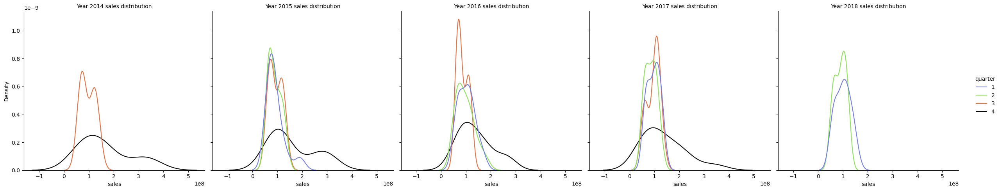

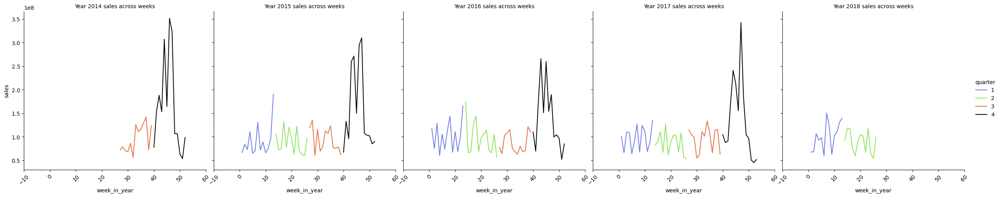

In [17]:
"""

Target (Sales) Data Analysis 

"""
colors = ['#747FE3', '#8EE35D', '#E37346','#090a09']


# 1) Distribution
ax = sns.displot(data=mmm_df3, x=target_column[0],col="year",hue= "quarter", kind="kde", palette=colors)
title = "sales distribution"
ax.set_titles("Year {col_name} " + title)
plt.show()

# 2) Sales over time
ax = sns.relplot(data = mmm_df3,x = "week_in_year", y = target_column[0],kind = "line",col= "year",hue='quarter', palette=colors).set_xticklabels(rotation = 45);
title = "sales across weeks"   
ax.set_titles("Year {col_name} " + title)
plt.show()

### Continuous Feature Distribtuion Analysis

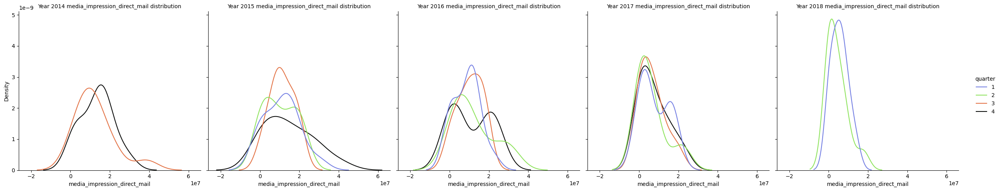

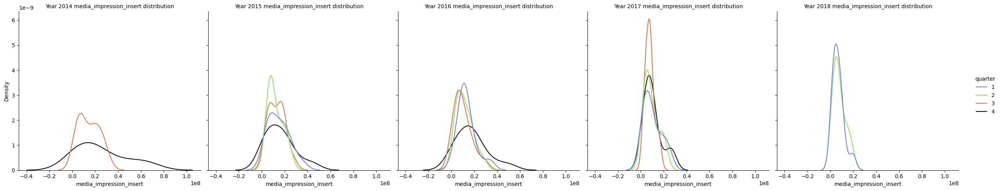

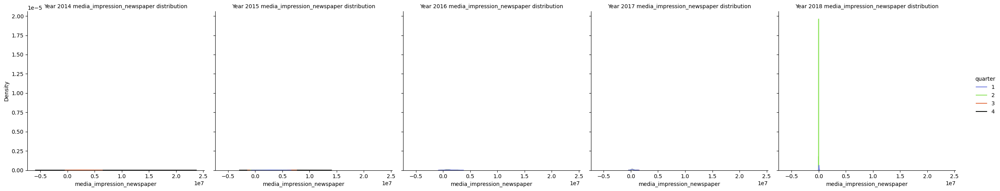

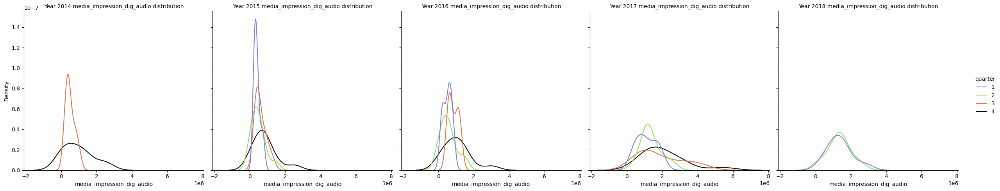

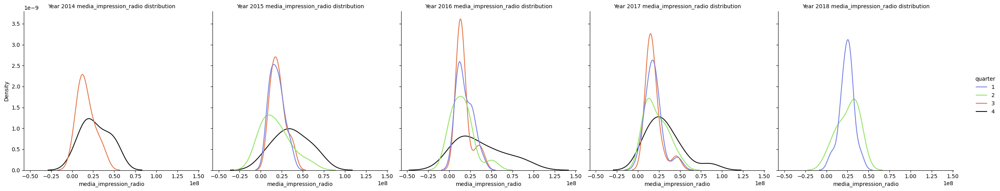

...

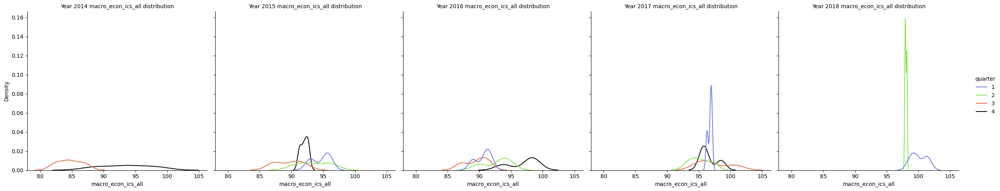

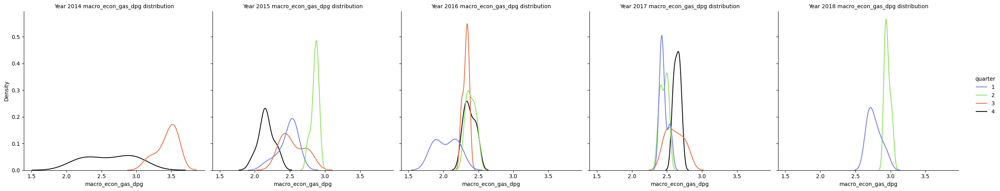

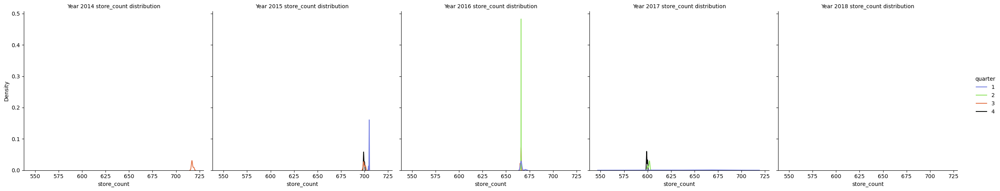

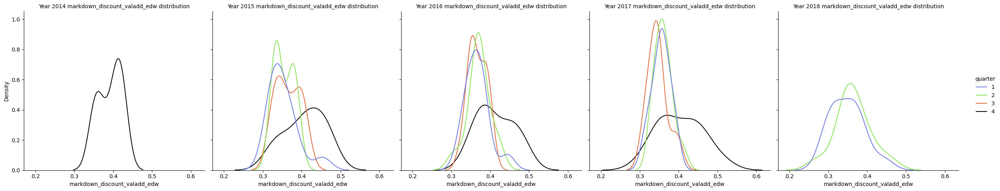

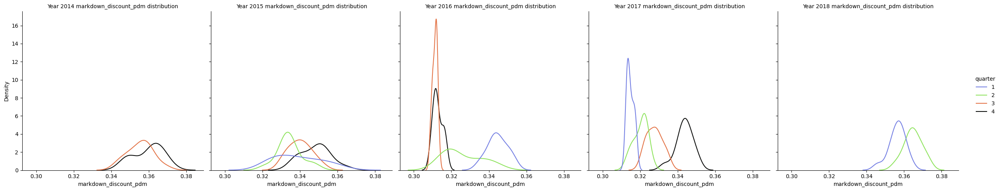

In [19]:
"""
Distribution of continuous features

"""
colors = ['#747FE3', '#8EE35D', '#E37346','#090a09']
for col in continuous_column:
    # sns.color_palette("viridis", as_cmap=True)
    ax = sns.displot(data=mmm_df3, x=col, hue="quarter",col="year", kind="kde", palette=colors)
    
    title = col + " distribution"   
    ax.set_titles("Year {col_name} " + title)
    plt.show()

### Target and Continuous Feature Comparison

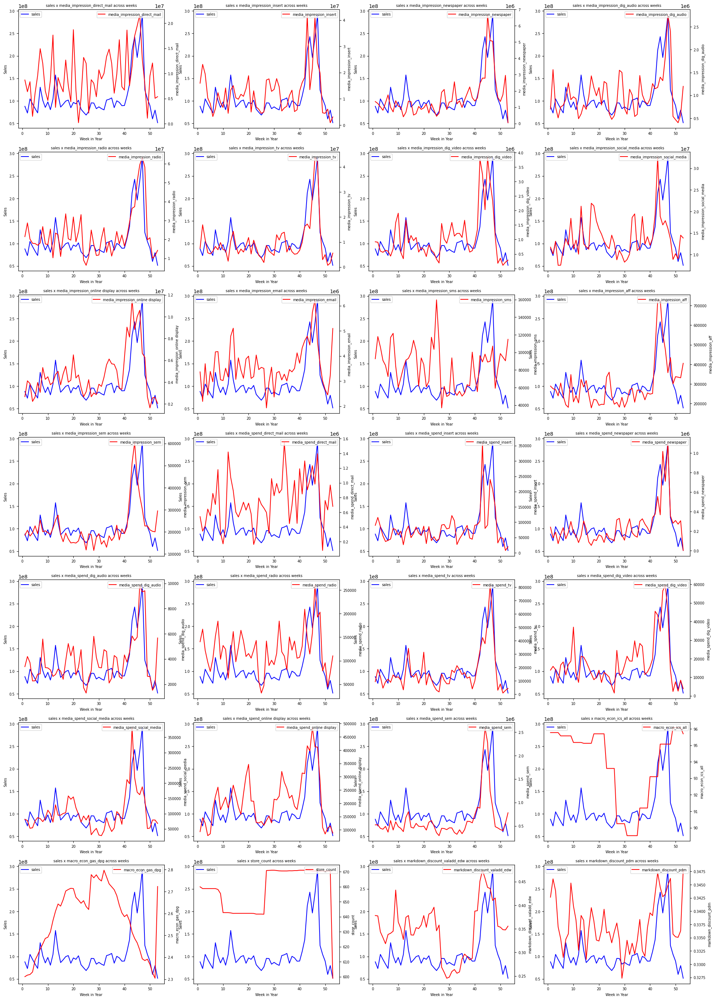

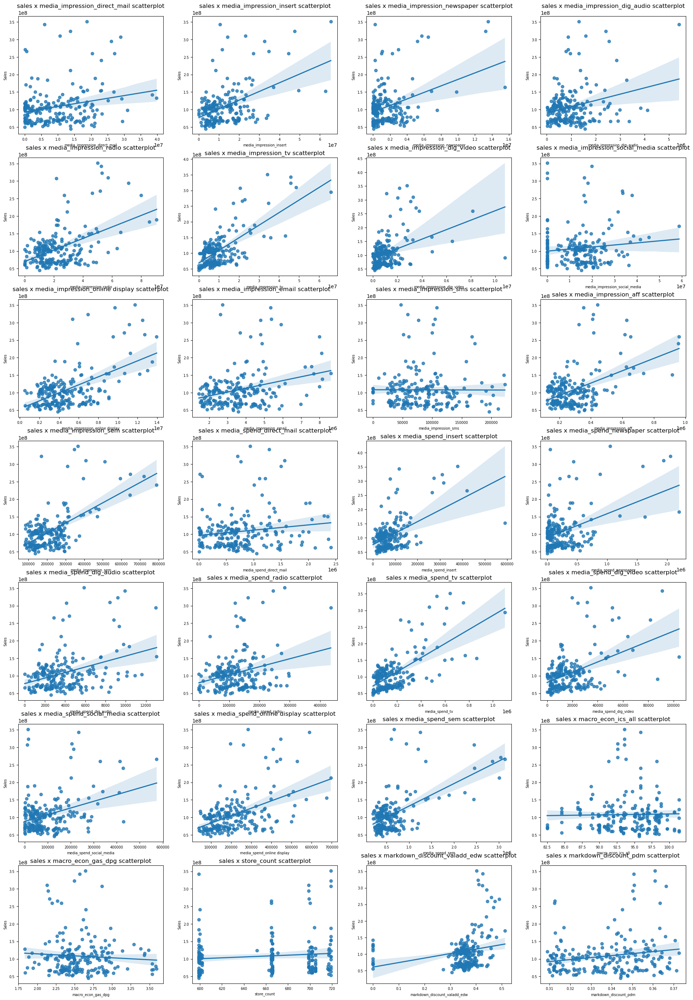

In [20]:
"""

Media spend/impressions and sales  over time

"""

colors = ['#747FE3', '#8EE35D', '#E37346','#090a09']
plt.figure(figsize=(24,35))
for col in enumerate(continuous_column):
    plt.subplot(7,4,col[0]+1)
    ax = sns.lineplot(data = mmm_df3,x = "week_in_year", y = target_column[0],color = 'blue',ci = None)
    ax.legend(['sales'],loc = "upper left",fontsize= 7)
    ax2 = ax.twinx()
    sns.lineplot(data = mmm_df3,x = "week_in_year", y = col[1],ax=ax2,color = 'red',ci = None)
    ax2.legend([col[1]],loc = "upper right",fontsize= 7)
    title = f"sales x {col[1]} across weeks"   
    ax.set_title(title,fontsize= 7)    
    ax.set_xlabel('Week in Year',fontsize= 7)
    ax.tick_params(axis='x', labelsize=7)
    ax.tick_params(axis='y', labelsize=7)
    ax.set_ylabel('Sales',fontsize= 7)
    ax2.set_ylabel(col[1],fontsize= 7)
    ax2.tick_params(axis='y', labelsize=7)

    # plt.show()

    # Scatterplot

plt.figure(figsize=(24,35))
for col in enumerate(continuous_column):
    plt.subplot(7,4,col[0]+1)
    # plt.figure().set_figwidth(8)
    # plt.figure().set_figheight(2)
    ay = sns.regplot(data=mmm_df3,x=col[1],y=target_column[0])
    ay.set_xlabel(col[1],fontsize= 7)
    ay.set_ylabel('Sales',fontsize= 7)
    ay.tick_params(axis='x', labelsize=7)
    ay.tick_params(axis='y', labelsize=7)

    title = f"sales x {col[1]} scatterplot"   
    plt.title(title)
    # plt.show()

    


### Sales analysis during Holidays

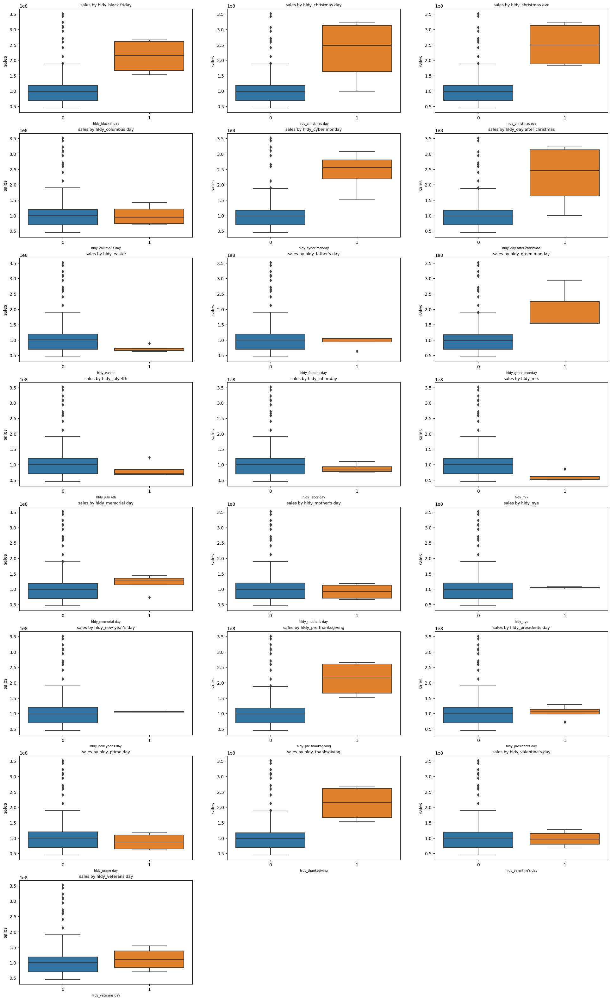

In [21]:
"""

Sales during holidays and Impressions during holidays



"""
plt.figure(figsize=(24,40))
for col in enumerate(one_hot_encoded_columns):
    if 'hldy' in col[1]:
        plt.subplot(8,3,col[0]+1)
        ax = sns.boxplot(data=mmm_df2,y = target_column[0],x = col[1])
        ax.set_xlabel(col[1],fontsize= 7)
        title = f"sales by {col[1]}"
        ax.set_title(title,fontsize= 9) 


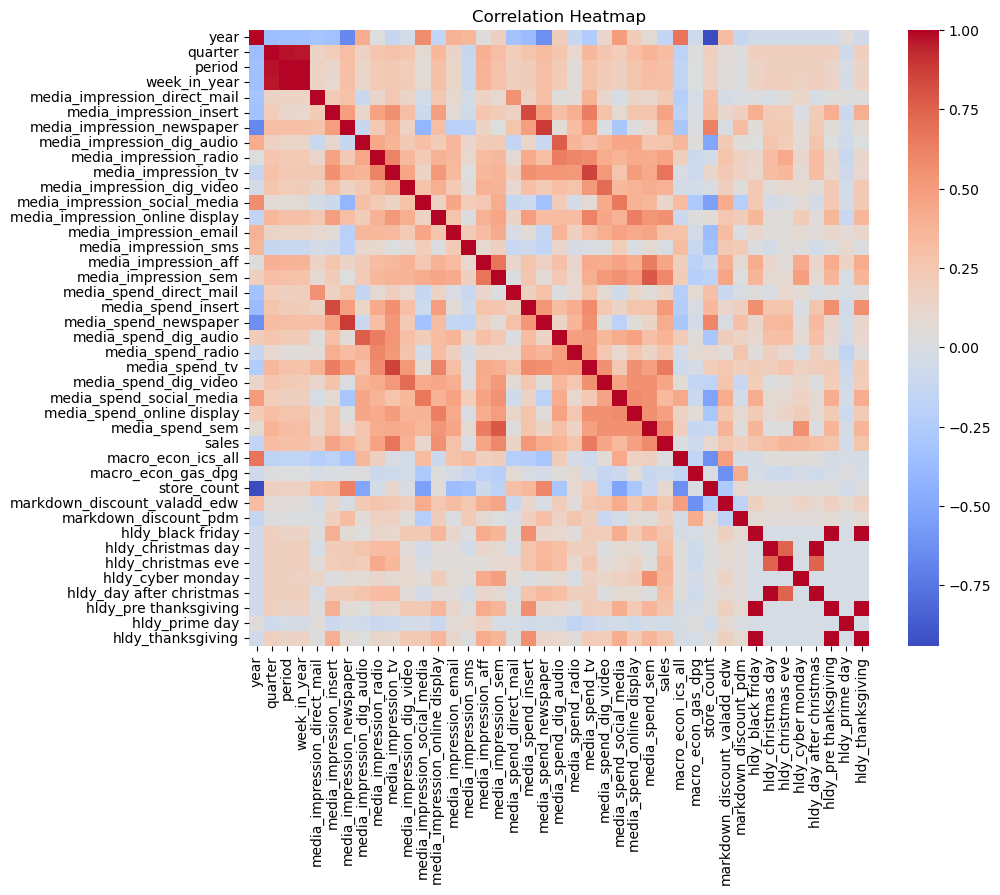

In [22]:
correlation_matrix = mmm_df3.corr()
sales_correlations = correlation_matrix['sales'].sort_values(ascending=False)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

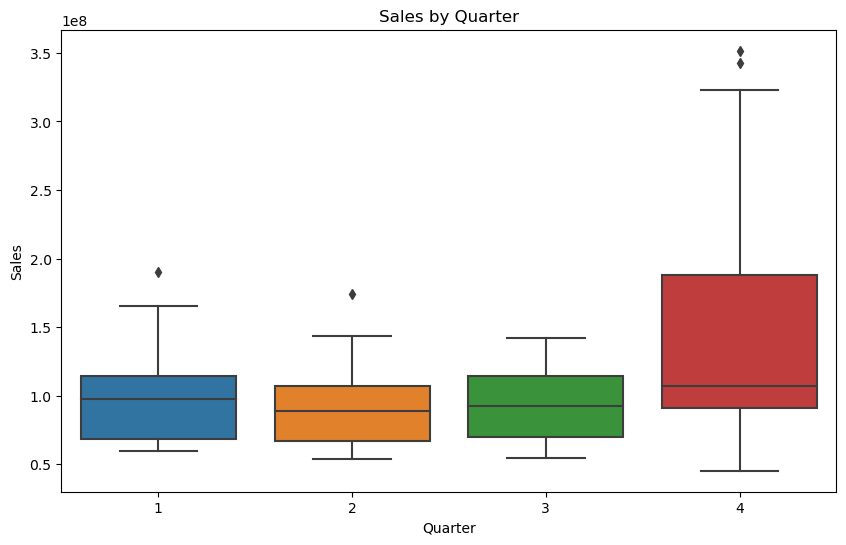

In [24]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='quarter', y='sales', data=mmm_df3)
plt.title('Sales by Quarter')
plt.xlabel('Quarter')
plt.ylabel('Sales')
plt.show()

In [25]:
correlation_with_sales = mmm_df3.corrwith(mmm_df3['sales']).sort_values(ascending=False)
print(correlation_with_sales)

sales                              1.000000
media_impression_tv                0.680728
media_spend_tv                     0.656737
media_impression_sem               0.590723
media_spend_sem                    0.586409
media_impression_online display    0.557900
media_spend_insert                 0.519472
media_spend_online display         0.483327
media_impression_radio             0.471456
media_impression_insert            0.466696
media_impression_aff               0.461302
media_spend_dig_video              0.458389
media_spend_newspaper              0.423797
media_impression_dig_video         0.392341
media_impression_newspaper         0.375287
media_spend_dig_audio              0.370946
hldy_christmas eve                 0.368311
hldy_cyber monday                  0.345099
media_spend_social_media           0.334859
quarter                            0.330243
hldy_christmas day                 0.310709
hldy_day after christmas           0.310709
week_in_year                    

<Axes: title={'center': 'Media Impressions Over Time'}, xlabel='week_start_date'>

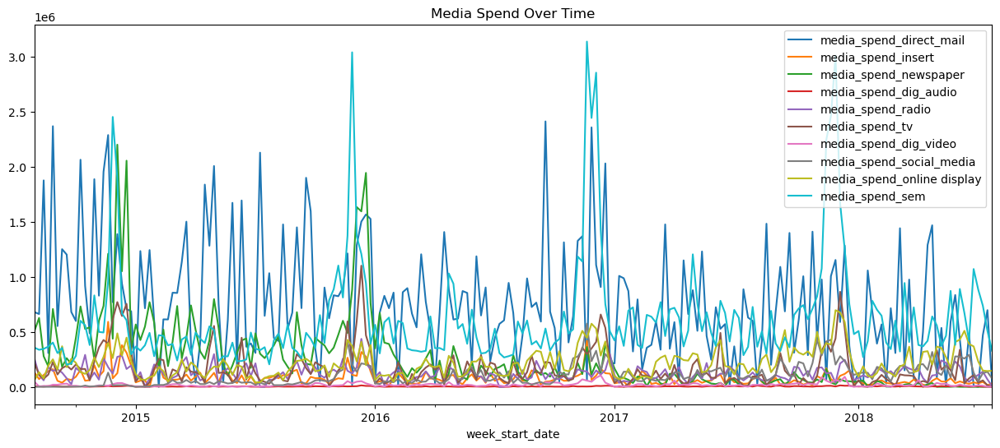

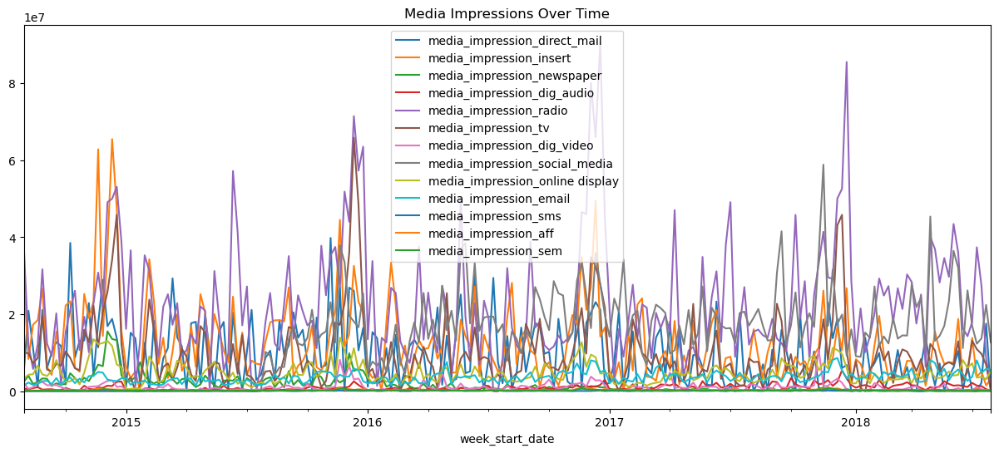

In [27]:
media_channels_spend = [col for col in mmm_df3.columns if col.startswith('media_spend_')]
media_channels_impressions = [col for col in mmm_df3.columns if col.startswith('media_impression_')]

# Plotting for Media Spend Over Time
mmm_df3.plot(x='week_start_date', y=media_channels_spend, figsize=(15, 6), title='Media Spend Over Time')

# Plotting for Media Impressions Over Time
mmm_df3.plot(x='week_start_date', y=media_channels_impressions, figsize=(15, 6), title='Media Impressions Over Time')

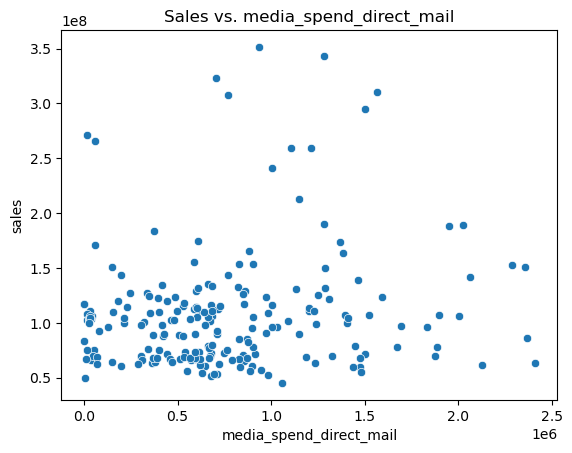

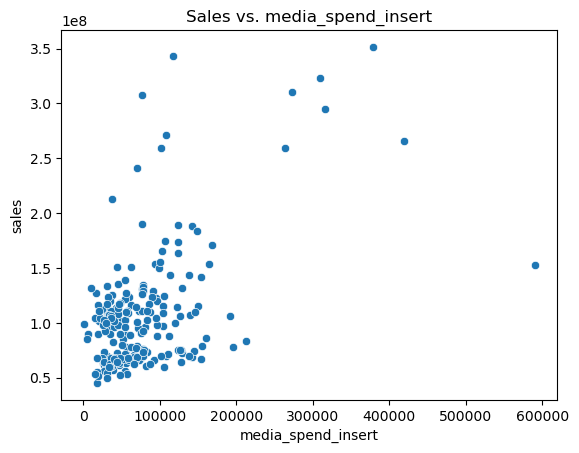

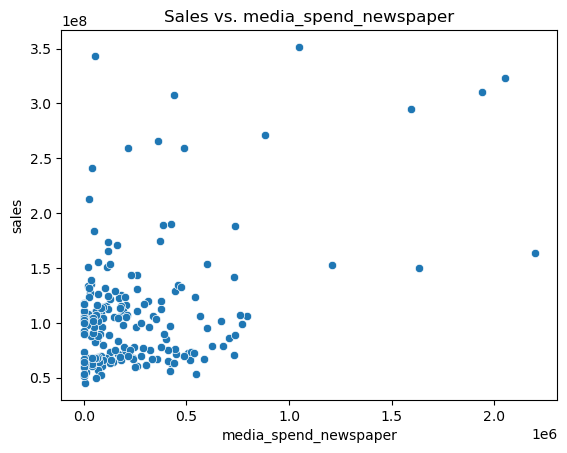

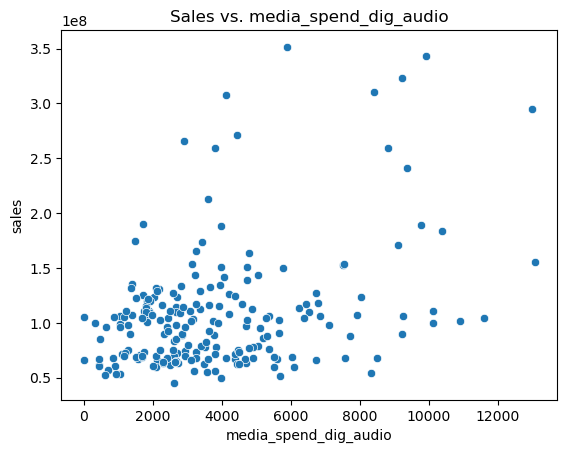

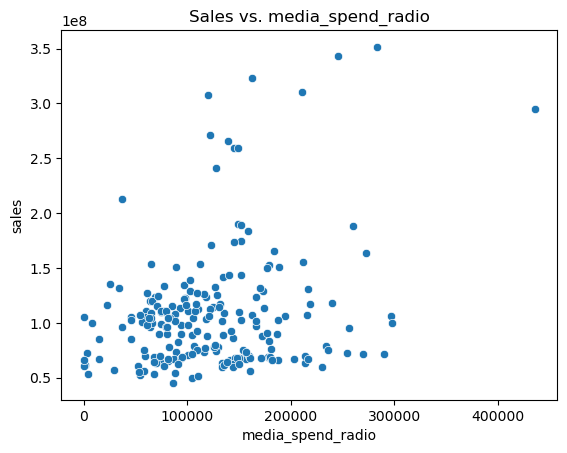

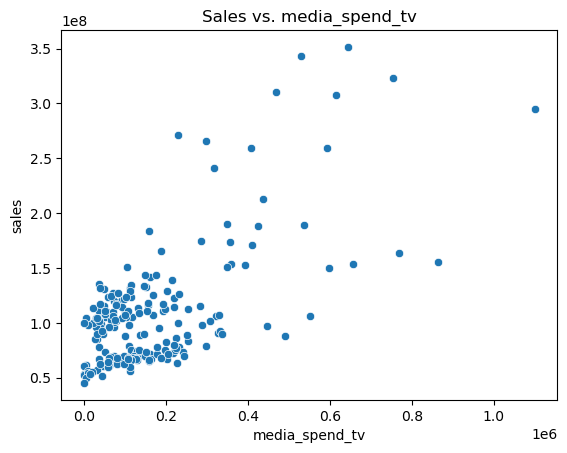

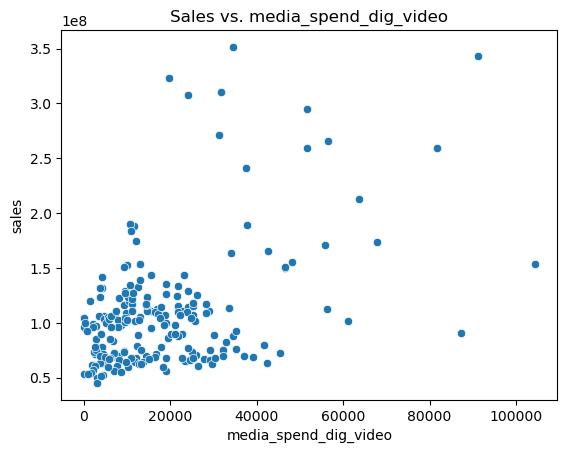

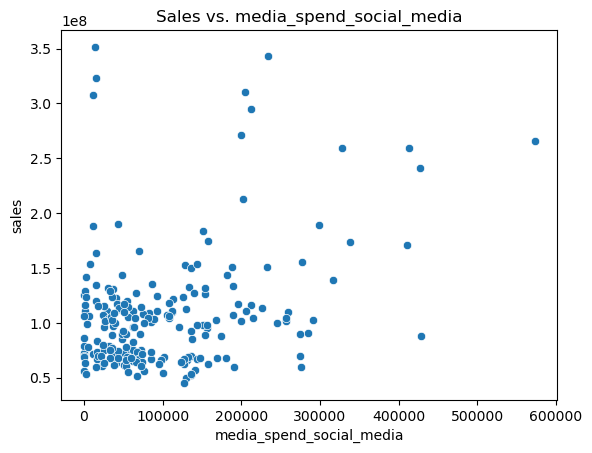

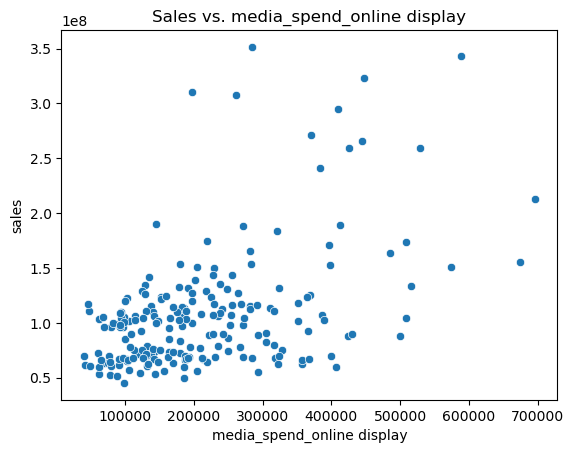

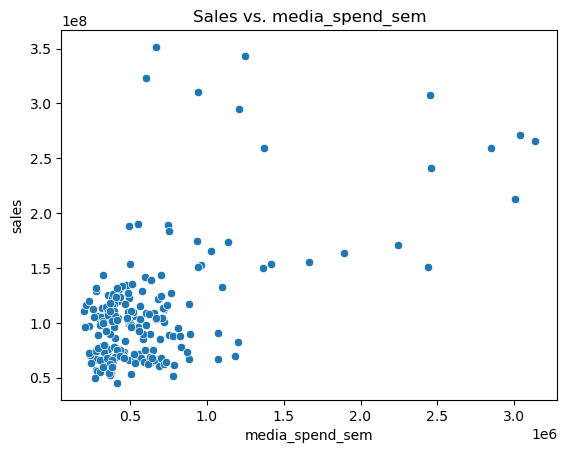

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

for channel in media_channels_spend:
    sns.scatterplot(data=mmm_df3, x=channel, y='sales')
    plt.title(f'Sales vs. {channel}')
    plt.show()

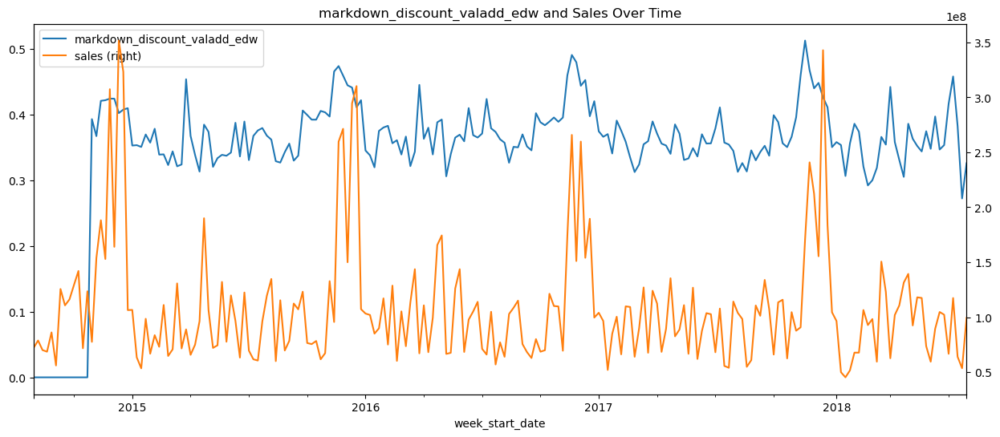

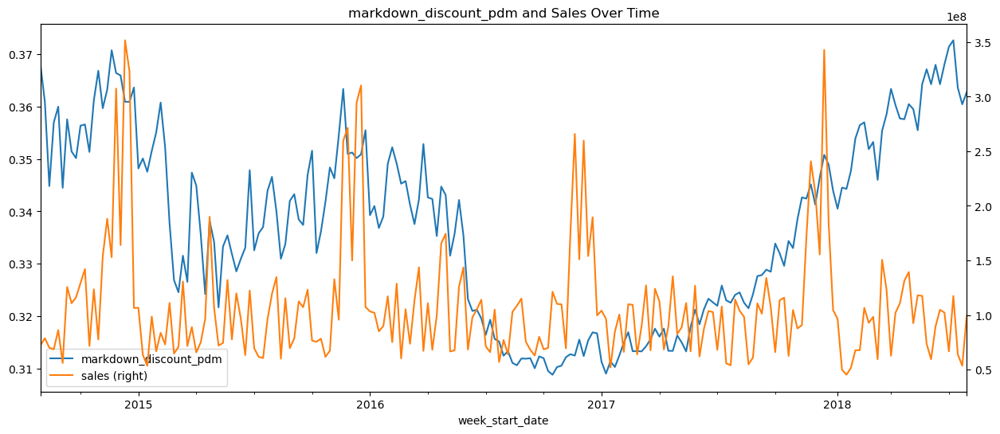

In [31]:
promo_discount_cols = [col for col in mmm_df3.columns if 'promo' in col or col.startswith('markdown_')]

for col in promo_discount_cols:
    mmm_df3.plot(x='week_start_date', y=[col, 'sales'], secondary_y='sales', figsize=(15, 6), title=f'{col} and Sales Over Time')


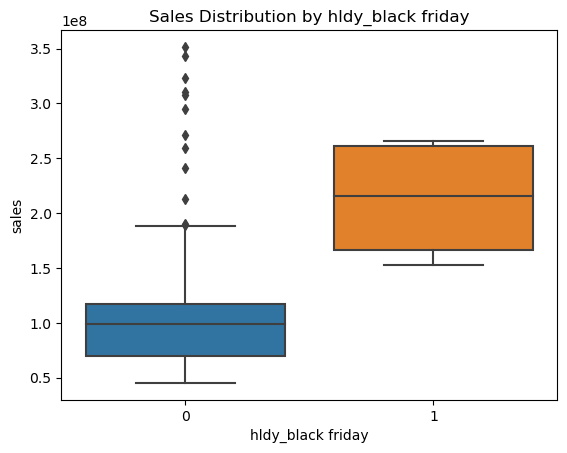

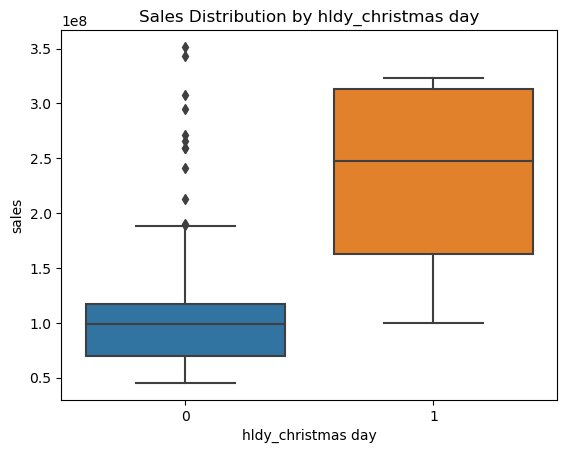

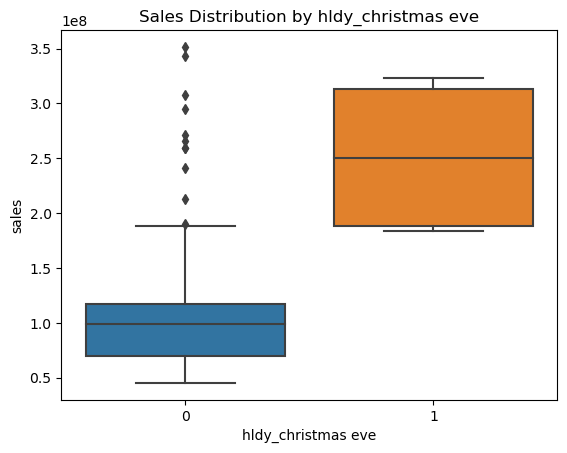

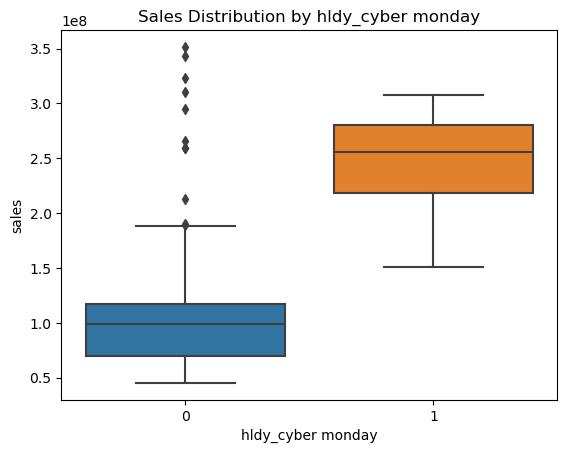

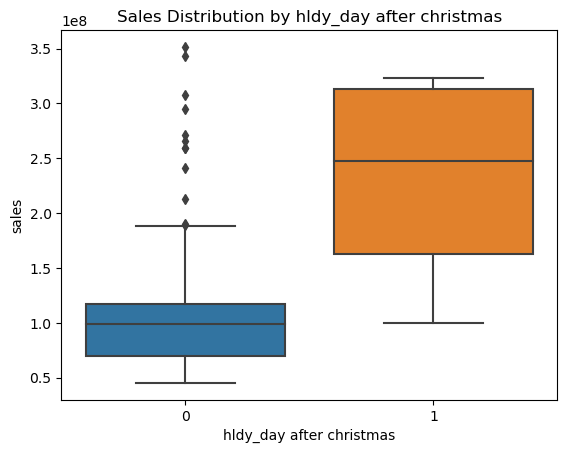

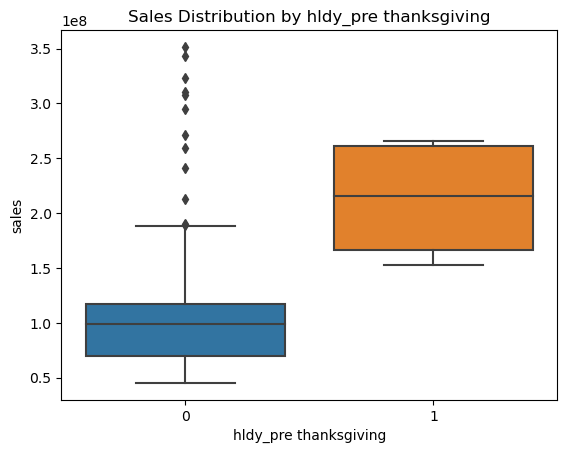

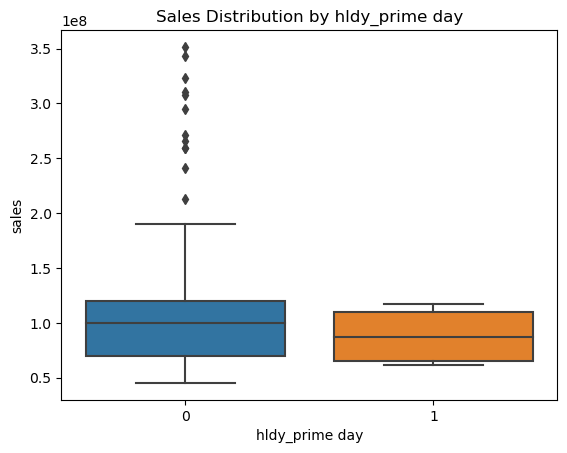

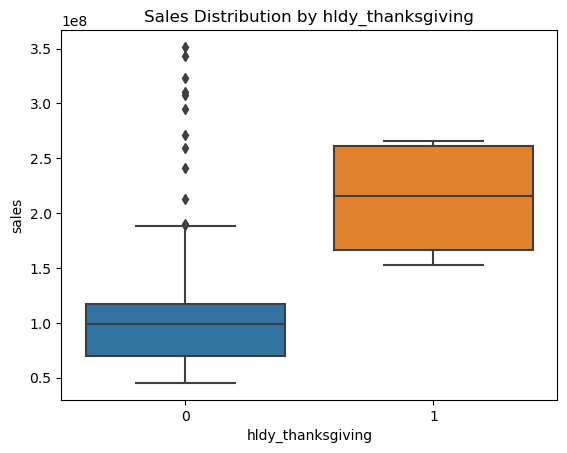

In [35]:
season_holiday_cols = [col for col in mmm_df3.columns if col.startswith('seas_') or col.startswith('hldy_')]

for col in season_holiday_cols:
    sns.boxplot(data=mmm_df3, x=col, y='sales')
    plt.title(f'Sales Distribution by {col}')
    plt.show()

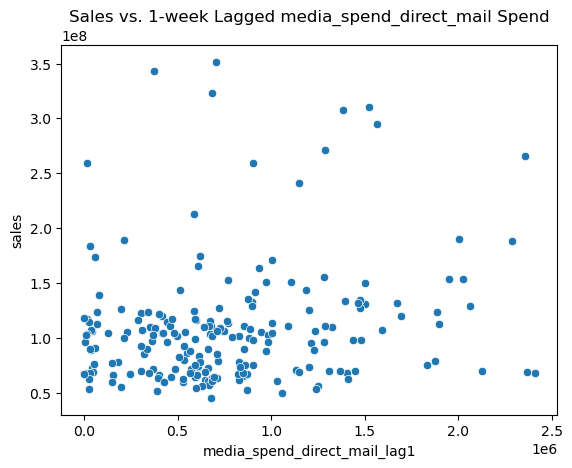

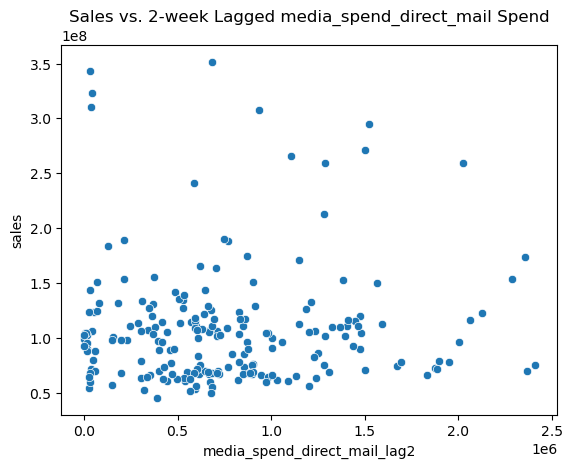

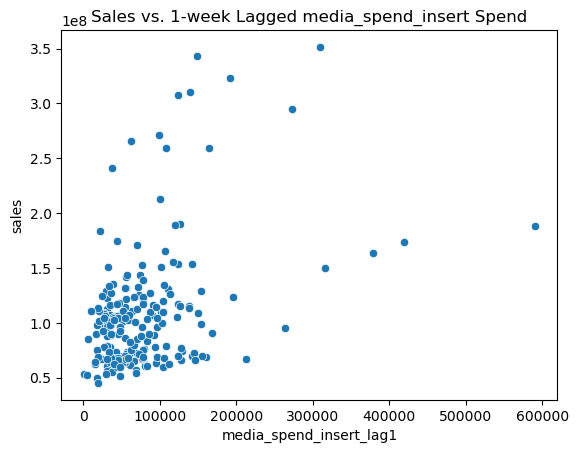

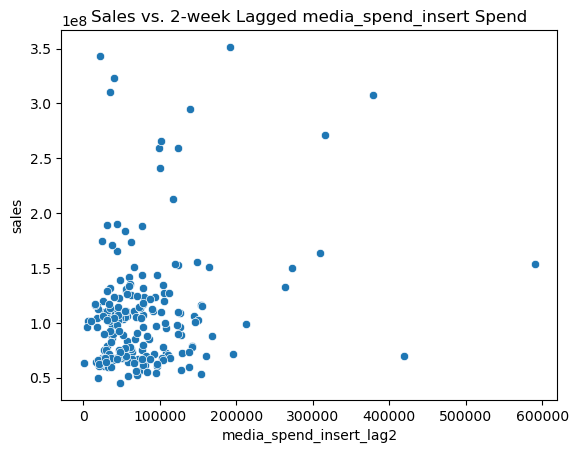

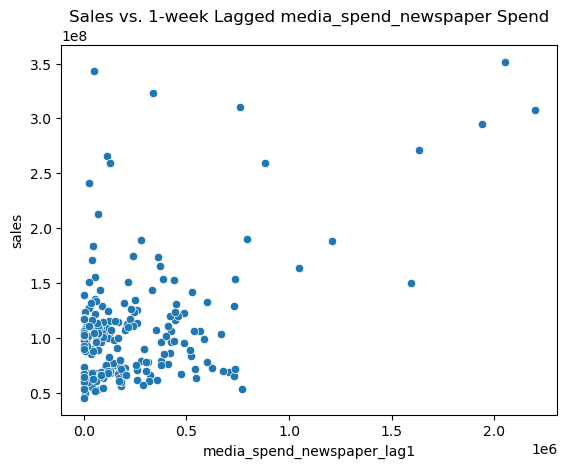

...

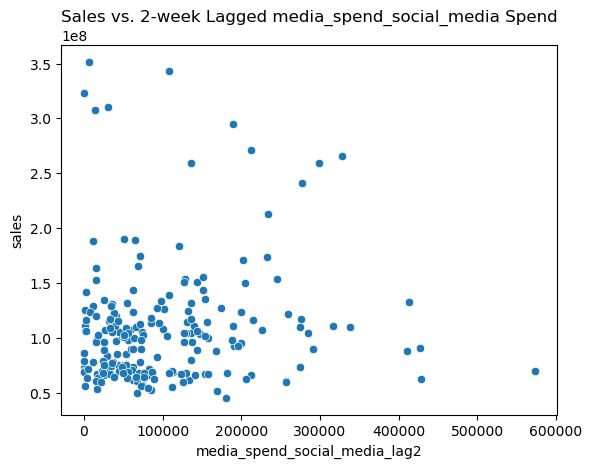

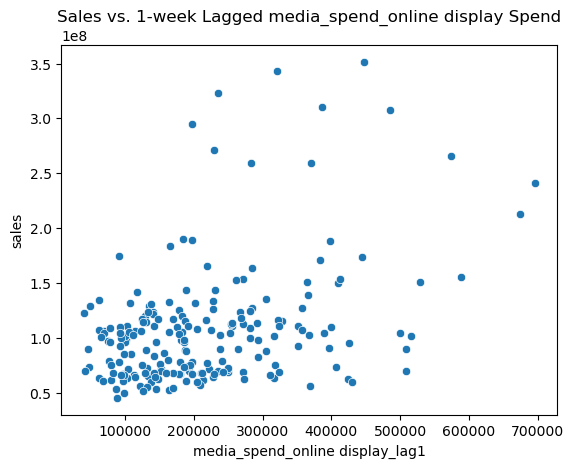

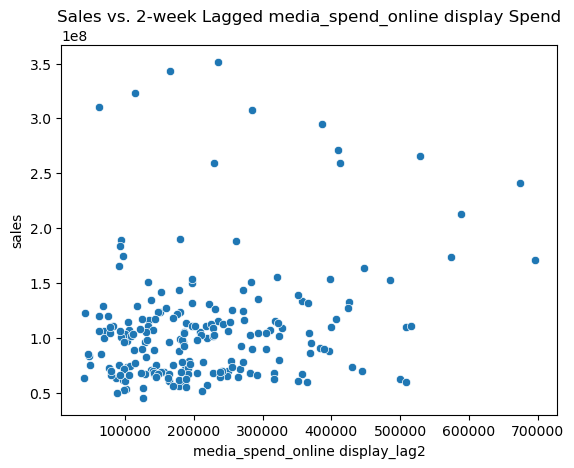

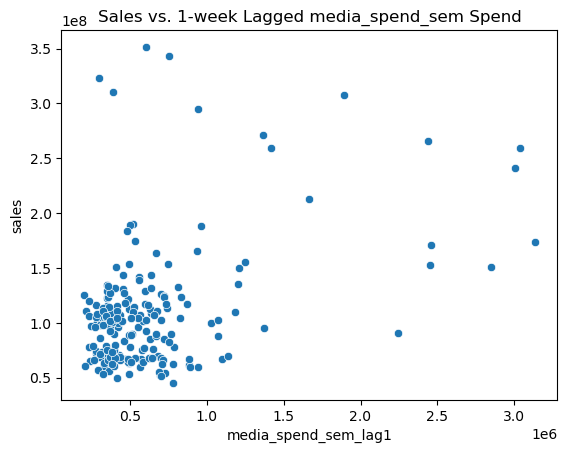

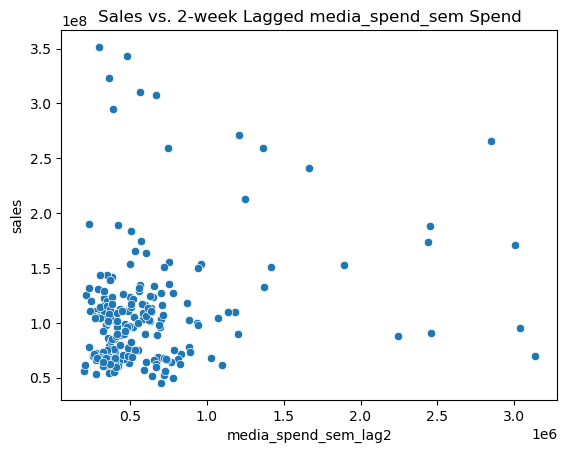

In [36]:
for channel in media_channels_spend:
    # Creating 1-week and 2-week lagged variables
    mmm_df3[f'{channel}_lag1'] = mmm_df3[channel].shift(-1)
    mmm_df3[f'{channel}_lag2'] = mmm_df3[channel].shift(-2)
    
    #1-week lag effect
    sns.scatterplot(data=mmm_df3, x=f'{channel}_lag1', y='sales')
    plt.title(f'Sales vs. 1-week Lagged {channel} Spend')
    plt.show()
    
    # 2-week lag effect
    sns.scatterplot(data=mmm_df3, x=f'{channel}_lag2', y='sales')
    plt.title(f'Sales vs. 2-week Lagged {channel} Spend')
    plt.show()

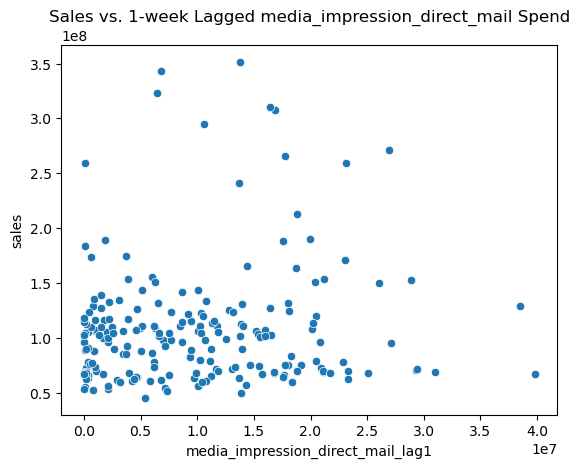

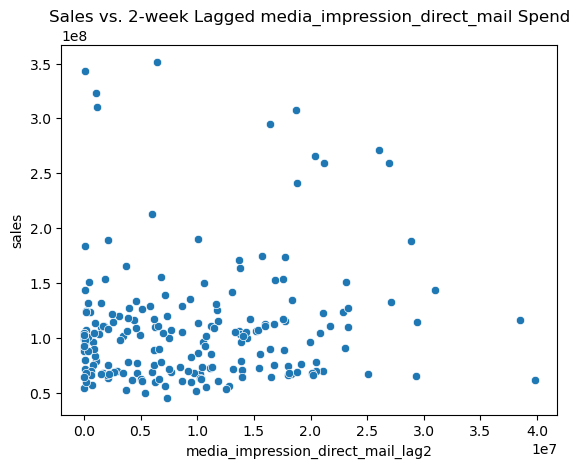

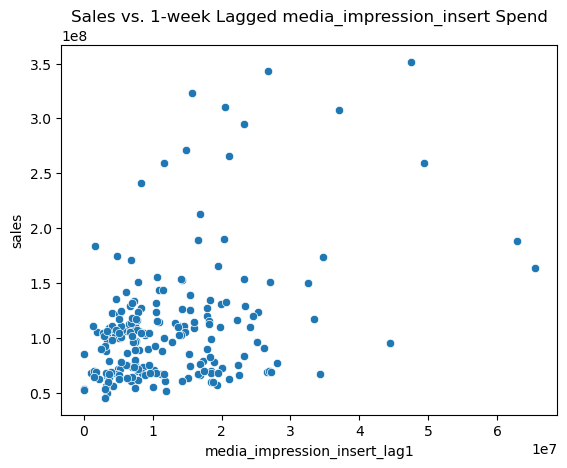

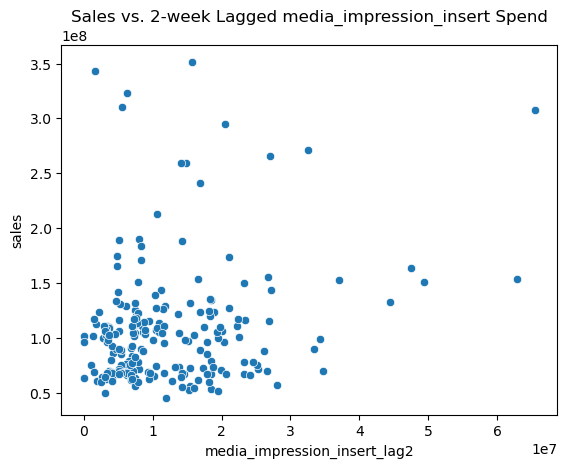

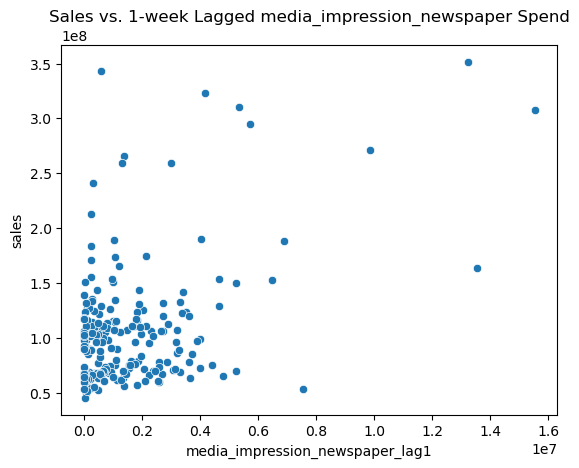

...

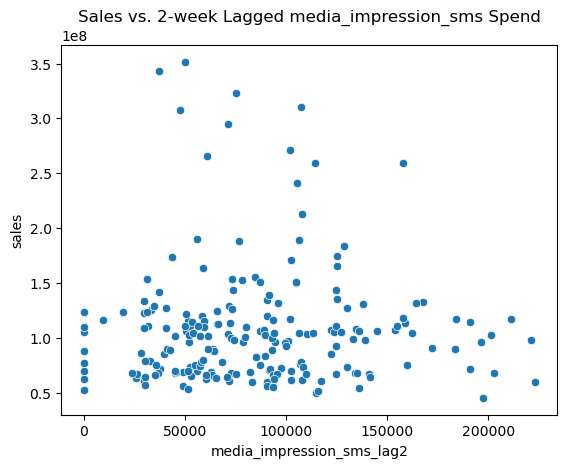

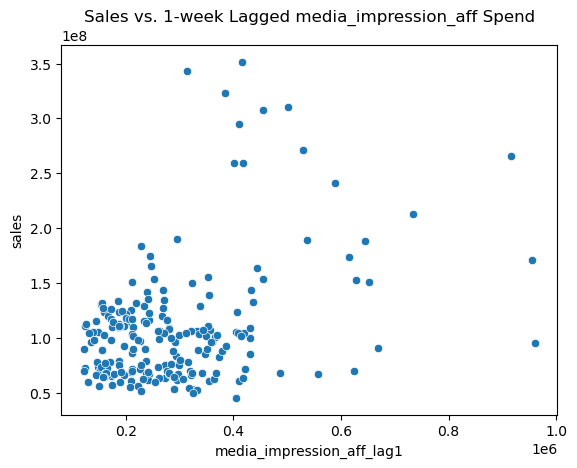

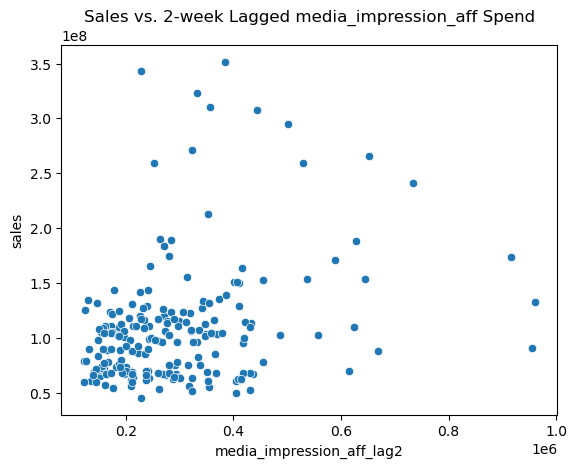

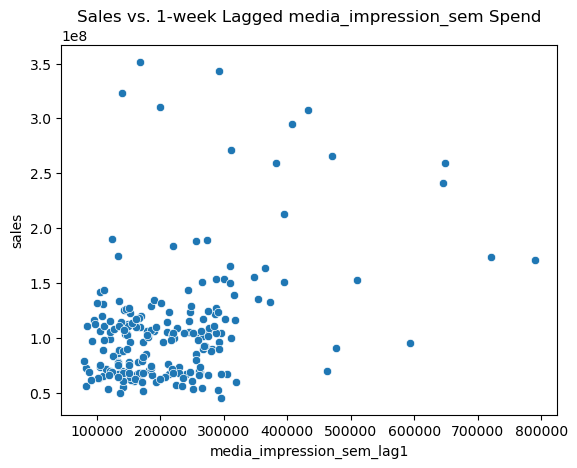

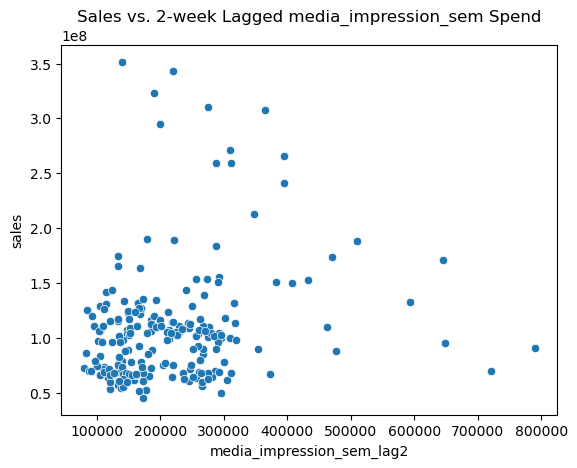

In [37]:
for channel in media_channels_impressions:
    # Creating 1-week and 2-week lagged variables
    mmm_df3[f'{channel}_lag1'] = mmm_df3[channel].shift(-1)
    mmm_df3[f'{channel}_lag2'] = mmm_df3[channel].shift(-2)
    
    #1-week lag effect
    sns.scatterplot(data=mmm_df3, x=f'{channel}_lag1', y='sales')
    plt.title(f'Sales vs. 1-week Lagged {channel} Spend')
    plt.show()
    
    # 2-week lag effect
    sns.scatterplot(data=mmm_df3, x=f'{channel}_lag2', y='sales')
    plt.title(f'Sales vs. 2-week Lagged {channel} Spend')
    plt.show()

In [39]:
def plot_with_trend_line_and_correlation(df, x_variable, y_variable='sales'):
    # Creating a new DataFrame for plotting that drops rows with NaN in the relevant columns
    plot_df = df[[x_variable, y_variable]].dropna()
    
    # Calculating the correlation coefficient for the original variable
    correlation = plot_df[x_variable].corr(plot_df[y_variable])
    
    # Creating 1-week and 2-week lagged variables for the x_variable
    plot_df[f'{x_variable}_lag1'] = plot_df[x_variable].shift(-1)
    plot_df[f'{x_variable}_lag2'] = plot_df[x_variable].shift(-2)
    
    # Dropping NaN values from the lagged DataFrames
    plot_df_lag1 = plot_df.dropna(subset=[f'{x_variable}_lag1', y_variable])
    plot_df_lag2 = plot_df.dropna(subset=[f'{x_variable}_lag2', y_variable])
    
    # Calculating the correlation coefficient for the lagged variables
    correlation_lag1 = plot_df_lag1[f'{x_variable}_lag1'].corr(plot_df_lag1[y_variable])
    correlation_lag2 = plot_df_lag2[f'{x_variable}_lag2'].corr(plot_df_lag2[y_variable])
    
    #plotting
    plt.figure(figsize=(18, 6))

    # Original variable scatterplot
    plt.subplot(1, 3, 1)
    sns.scatterplot(data=plot_df, x=x_variable, y=y_variable)
    z = np.polyfit(plot_df[x_variable], plot_df[y_variable], 1)
    p = np.poly1d(z)
    plt.plot(plot_df[x_variable], p(plot_df[x_variable]), "r--")
    plt.title(f'Original {y_variable} vs. {x_variable}\n(Correlation: {correlation:.2f})')

    # 1-week lag scatterplot
    plt.subplot(1, 3, 2)
    sns.scatterplot(data=plot_df_lag1, x=f'{x_variable}_lag1', y=y_variable)
    z_lag1 = np.polyfit(plot_df_lag1[f'{x_variable}_lag1'], plot_df_lag1[y_variable], 1)
    p_lag1 = np.poly1d(z_lag1)
    plt.plot(plot_df_lag1[f'{x_variable}_lag1'], p_lag1(plot_df_lag1[f'{x_variable}_lag1']), "r--")
    plt.title(f'1-week Lag {y_variable} vs. {x_variable}\n(Correlation: {correlation_lag1:.2f})')

    # 2-week lag scatterplot
    plt.subplot(1, 3, 3)
    sns.scatterplot(data=plot_df_lag2, x=f'{x_variable}_lag2', y=y_variable)
    z_lag2 = np.polyfit(plot_df_lag2[f'{x_variable}_lag2'], plot_df_lag2[y_variable], 1)
    p_lag2 = np.poly1d(z_lag2)
    plt.plot(plot_df_lag2[f'{x_variable}_lag2'], p_lag2(plot_df_lag2[f'{x_variable}_lag2']), "r--")
    plt.title(f'2-week Lag {y_variable} vs. {x_variable}\n(Correlation: {correlation_lag2:.2f})')

    plt.tight_layout()
    plt.show()

    # Return the correlation values
    return correlation, correlation_lag1, correlation_lag2



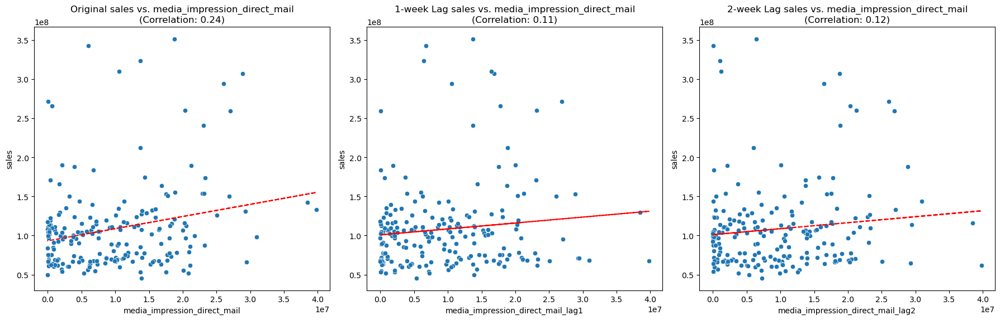

(0.23606355471826787, 0.11483661489740195, 0.1159802494291464)

In [40]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_direct_mail')

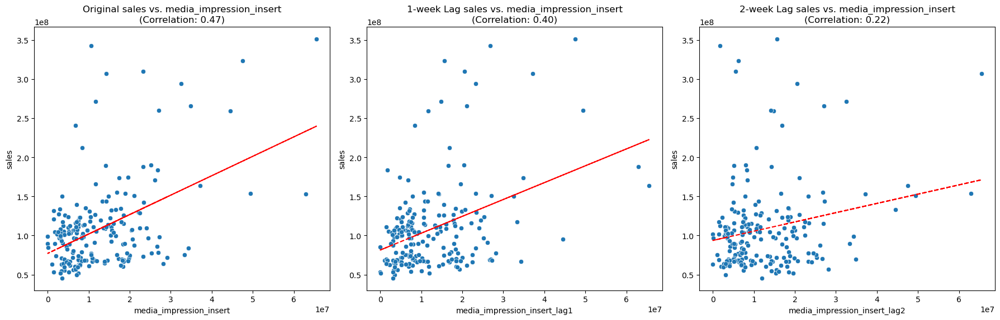

(0.466696047162836, 0.40246710667612406, 0.22160195172895913)

In [41]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_insert')

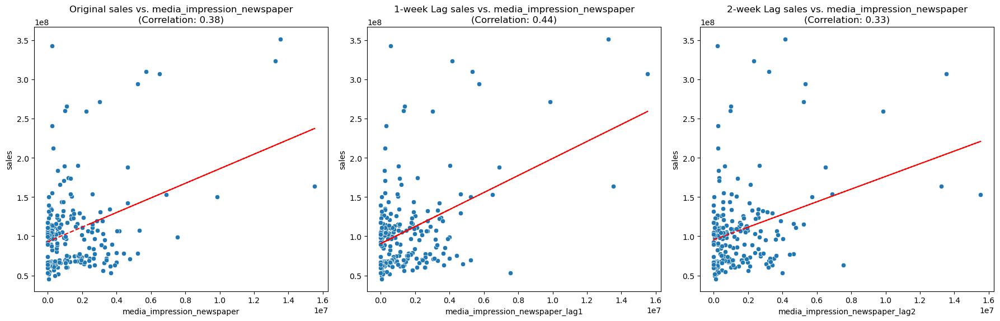

(0.37528735419056997, 0.4379832984645454, 0.3259621443900776)

In [42]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_newspaper')

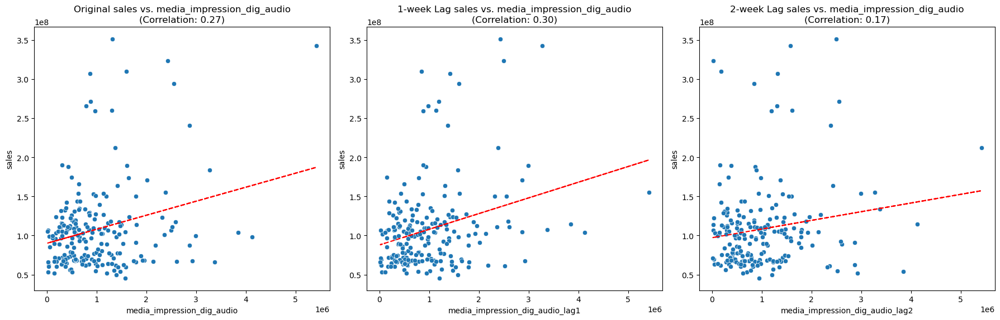

(0.2666296927005228, 0.29821704084561973, 0.16515670741850122)

In [43]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_dig_audio')

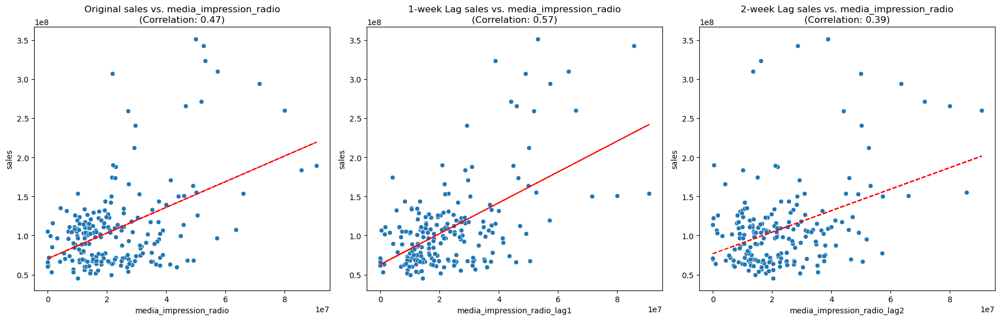

(0.47145554446280086, 0.5651052146924326, 0.3943231922696074)

In [44]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_radio')

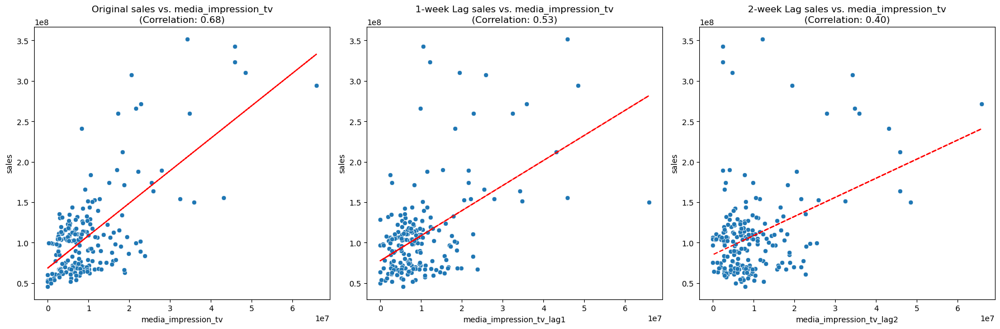

(0.680728491902644, 0.5254778534673945, 0.4015409356574561)

In [45]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_tv')

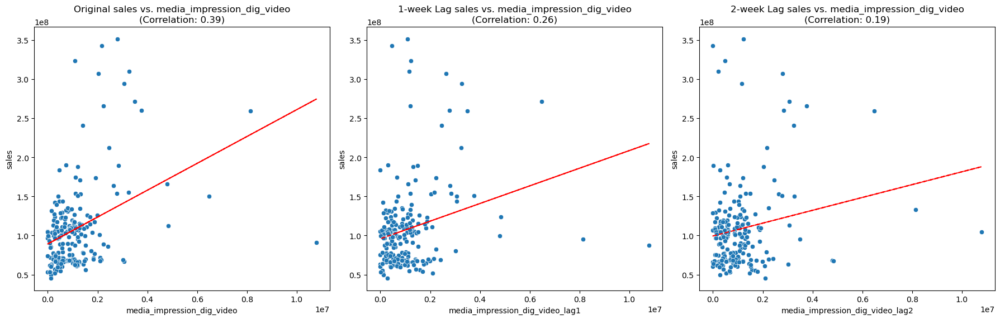

(0.3923410471989002, 0.25742256948094705, 0.18769597815957553)

In [46]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_dig_video')

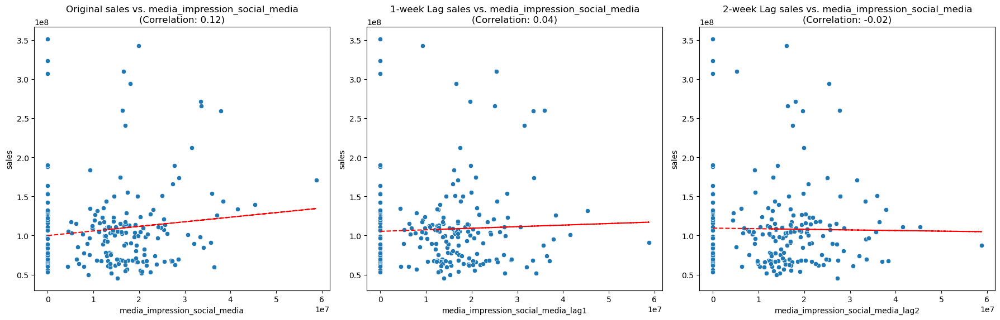

(0.11733818470883976, 0.039700578580397855, -0.015253847142658667)

In [47]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_social_media')

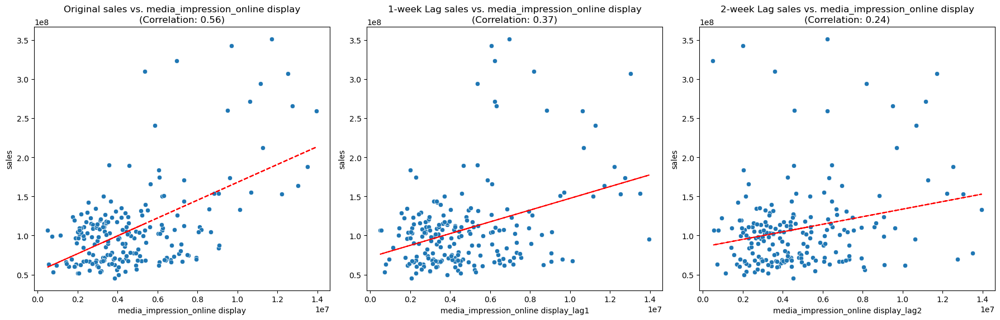

(0.5579004610122649, 0.3672569907922535, 0.23679616636183642)

In [48]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_online display')

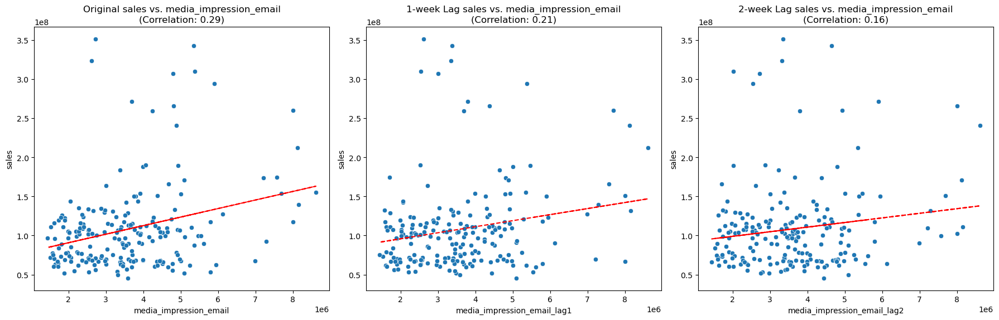

(0.29400933907951615, 0.2069736769483044, 0.15780405421043442)

In [49]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_email')

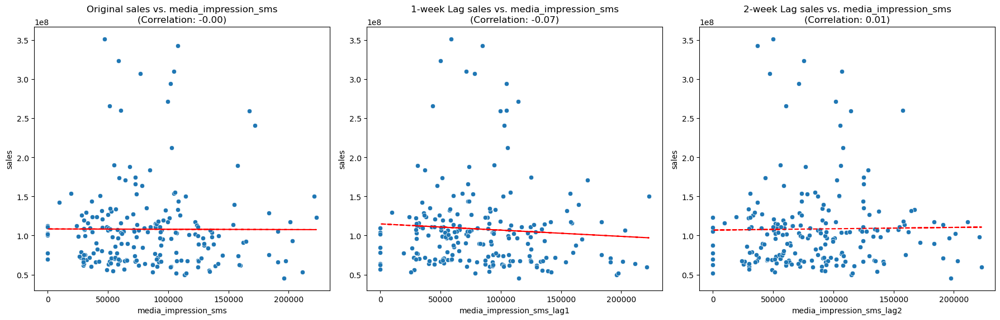

(-0.003497986047171562, -0.06944821212405093, 0.014874156460072754)

In [50]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_sms')

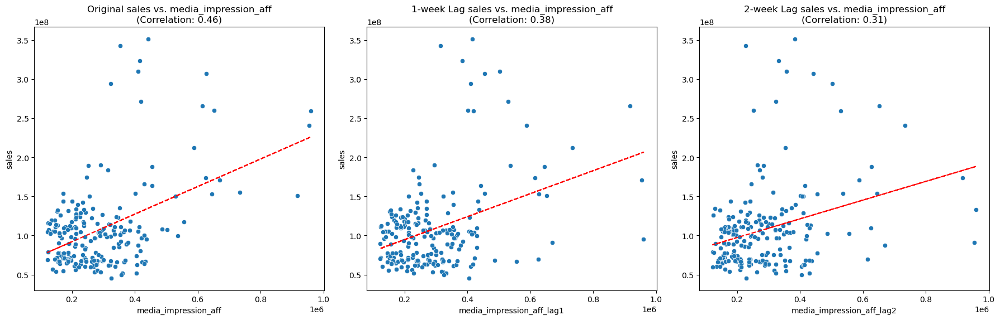

(0.46130180234615387, 0.3842819222625483, 0.31263231403478275)

In [51]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_aff')

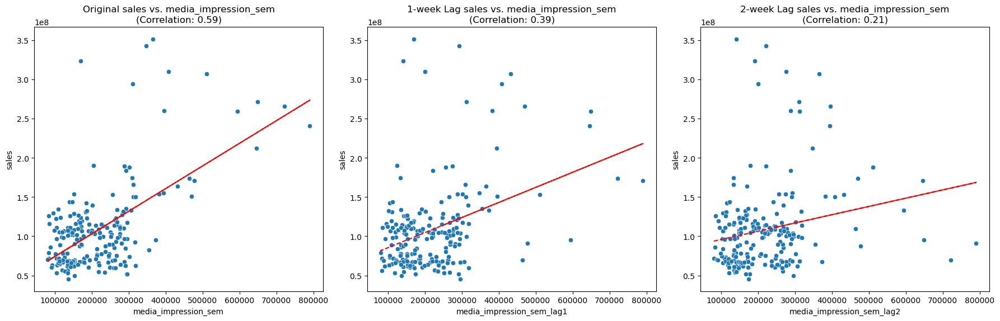

(0.5907233839113564, 0.3921185798767333, 0.21460454016373176)

In [52]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_impression_sem')

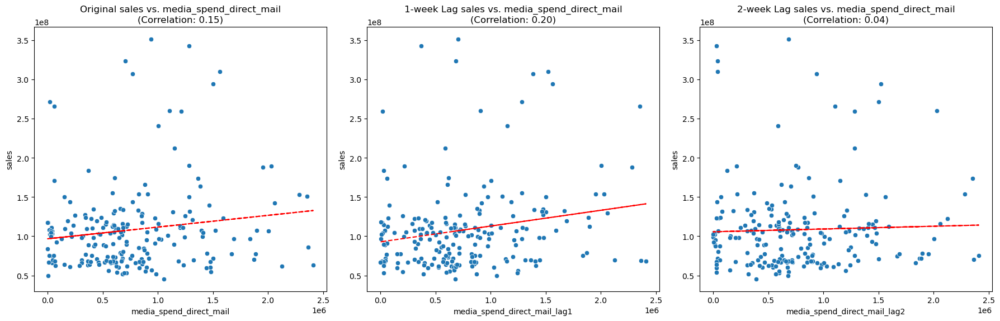

(0.14853884265684994, 0.19993104975103956, 0.03518410568133364)

In [53]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_direct_mail')

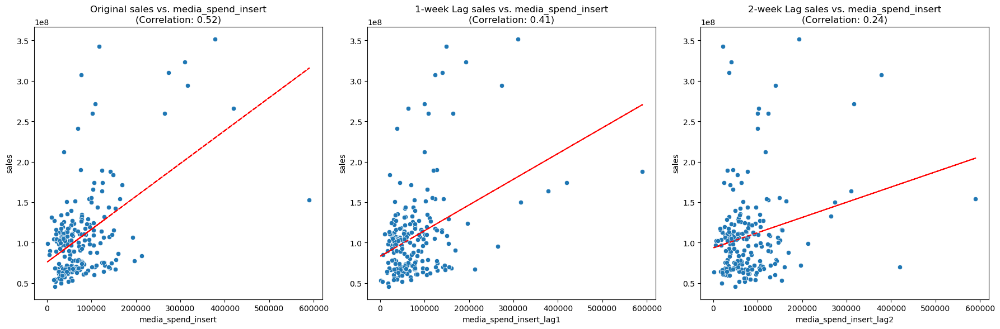

(0.5194721402675021, 0.405451713011717, 0.24037764500035283)

In [54]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_insert')

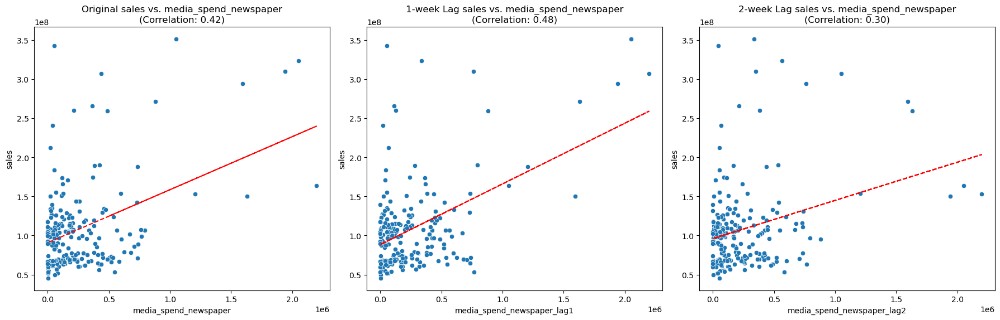

(0.42379678235820933, 0.48428742370419564, 0.3047837629101562)

In [55]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_newspaper')

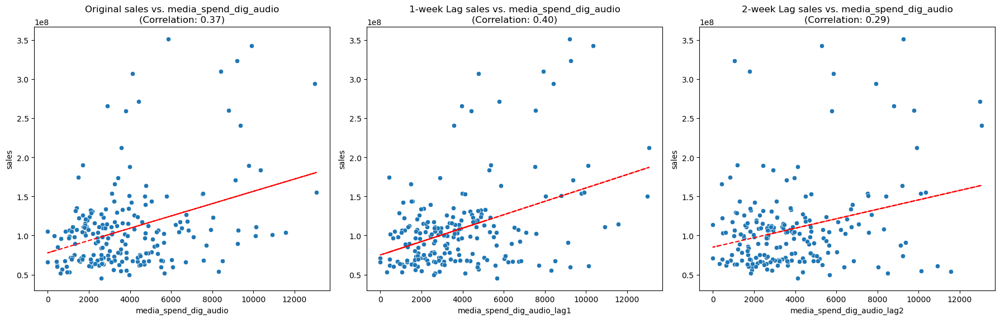

(0.37094599909021747, 0.4040414144151351, 0.2853959863742419)

In [56]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_dig_audio')

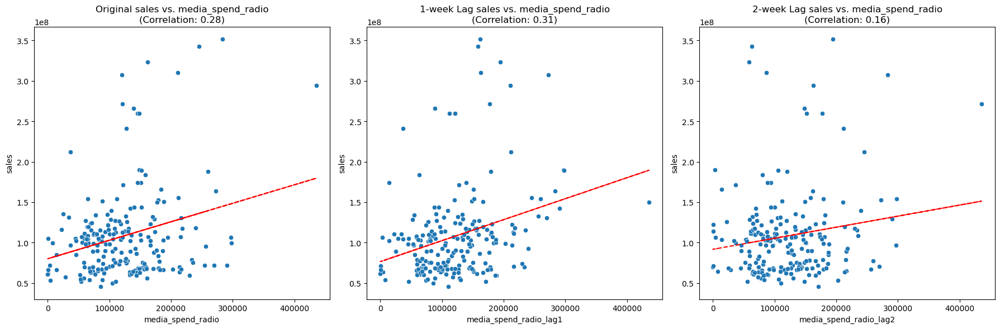

(0.27662956661627586, 0.3109669864923355, 0.1642472111840988)

In [57]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_radio')

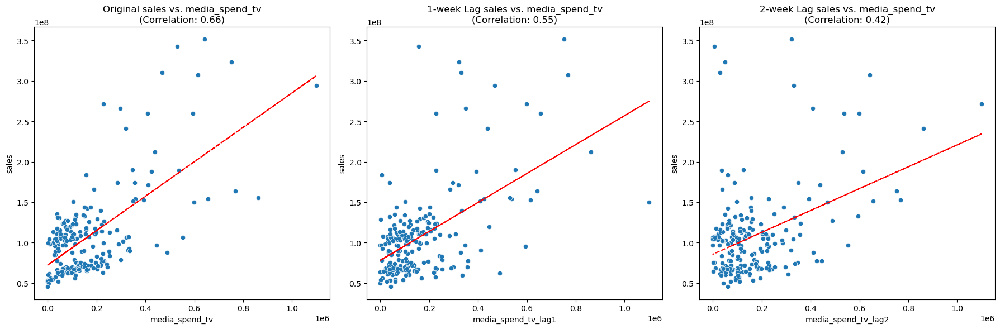

(0.6567368643524839, 0.5521578827420877, 0.41809537365217053)

In [58]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_tv')

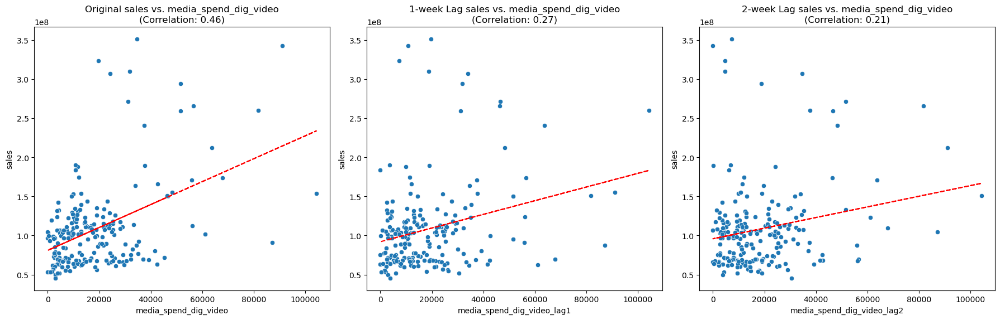

(0.45838923995709885, 0.27198245185156594, 0.21157268782656058)

In [59]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_dig_video')

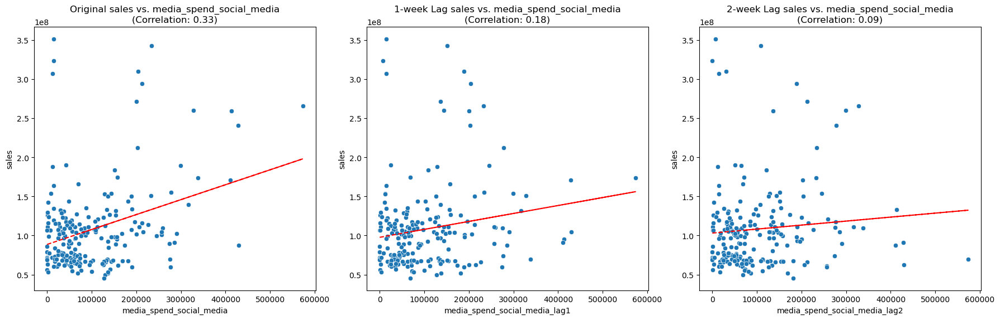

(0.3348588640275477, 0.17797847024433056, 0.08921798374685222)

In [60]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_social_media')

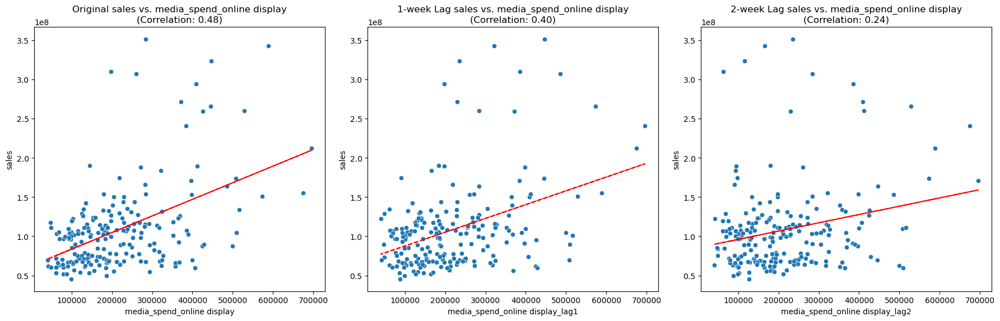

(0.48332734402603117, 0.3996828578843755, 0.24069429552893787)

In [61]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_online display')

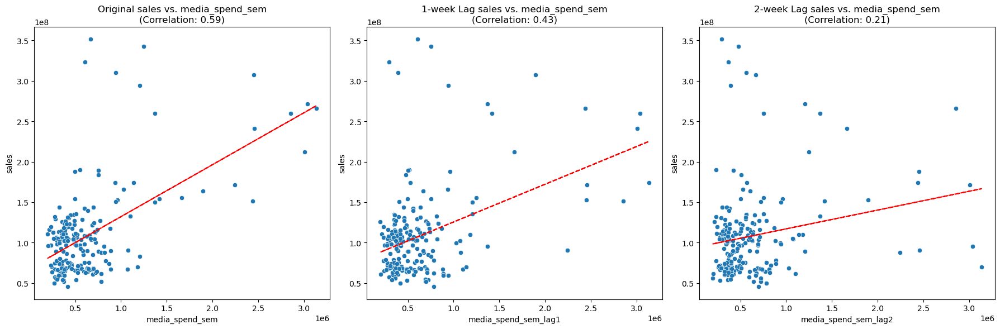

(0.5864087209773982, 0.4255440734420614, 0.2122264510450451)

In [62]:
plot_with_trend_line_and_correlation(mmm_df3, 'media_spend_sem')


In [70]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd

def plot_line_charts_with_lags(df, x_variable, y_variable='sales'):
    """
    Creates a 1x3 matrix of line charts with the specified x variable and sales over time,
    including charts with 1-week and 2-week lags for the x variable, all scaled based on Z-scores.

    Args:
    - df (DataFrame): The dataset containing the variables.
    - x_variable (str): The name of the x variable to plot against time.
    - y_variable (str): The name of the y variable, default is 'sales'.
    """

    # Ensuring the date column is in datetime format
    df['week_start_date'] = pd.to_datetime(df['week_start_date'])

    # Creating lagged variables
    df[f'{x_variable}_lag1'] = df[x_variable].shift(-1)
    df[f'{x_variable}_lag2'] = df[x_variable].shift(-2)

    # Scaling the variables based on Z-scores
    scaler = StandardScaler()
    scaled_vars = scaler.fit_transform(df[[y_variable, x_variable, f'{x_variable}_lag1', f'{x_variable}_lag2']].dropna())
    df_scaled = pd.DataFrame(scaled_vars, columns=[y_variable, x_variable, f'{x_variable}_lag1', f'{x_variable}_lag2'])

    # Setting up the figure for plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    # Because scaling and shifting may lead to a different number of rows, we need to align the date index.
    dates = df['week_start_date'][-len(df_scaled):]

    # Original variable line chart
    axes[0].plot(dates, df_scaled[y_variable], label=y_variable, color='blue')
    axes[0].plot(dates, df_scaled[x_variable], label=x_variable, color='red')
    axes[0].set_title(f'Original {y_variable} and {x_variable} (Scaled)')
    axes[0].legend(loc='upper left')

    # 1-week lag line chart
    axes[1].plot(dates, df_scaled[y_variable], label=y_variable, color='blue')
    axes[1].plot(dates, df_scaled[f'{x_variable}_lag1'], label=f'{x_variable} (1-week lag)', color='red')
    axes[1].set_title(f'{y_variable} and 1-week Lag of {x_variable} (Scaled)')
    axes[1].legend(loc='upper left')

    # 2-week lag line chart
    axes[2].plot(dates, df_scaled[y_variable], label=y_variable, color='blue')
    axes[2].plot(dates, df_scaled[f'{x_variable}_lag2'], label=f'{x_variable} (2-week lag)', color='red')
    axes[2].set_title(f'{y_variable} and 2-week Lag of {x_variable} (Scaled)')
    axes[2].legend(loc='upper left')

    
    for ax in axes:
        ax.set_xlabel('Date')
        ax.set_ylabel('Scaled Value')
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()


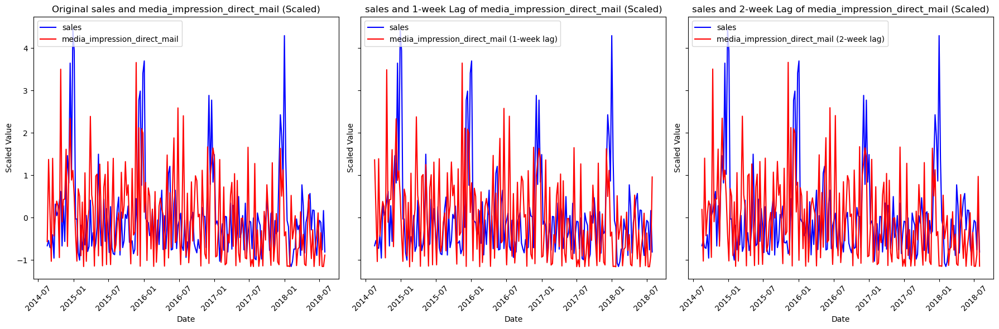

In [72]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_direct_mail')

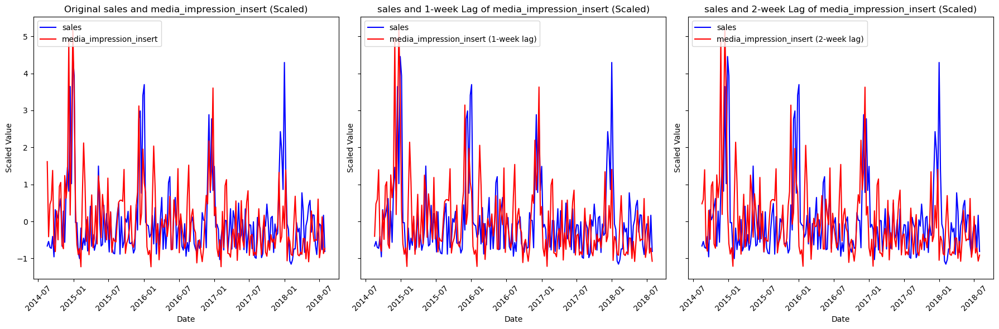

In [73]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_insert')

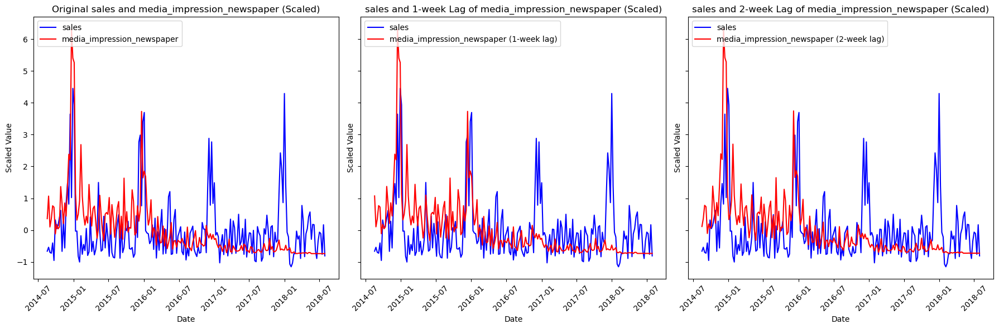

In [74]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_newspaper')

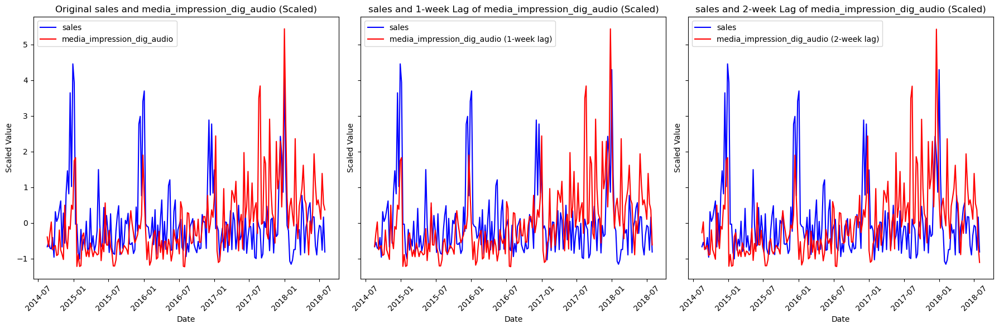

In [75]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_dig_audio')

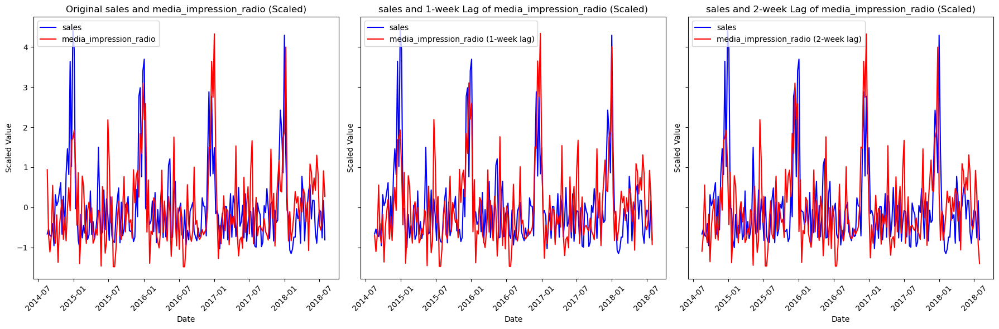

In [76]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_radio')

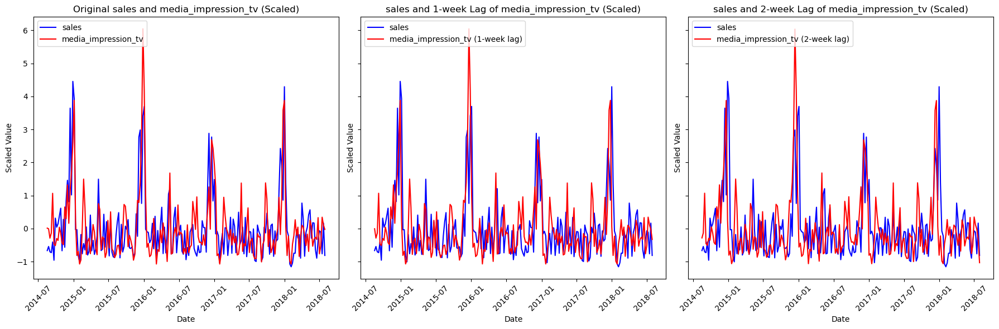

In [77]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_tv')

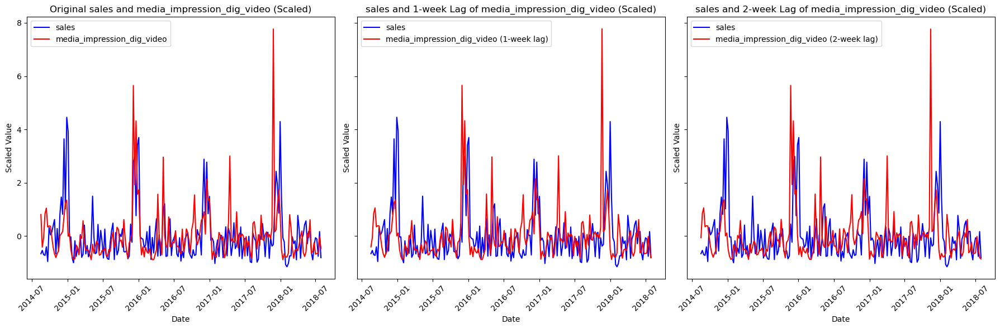

In [78]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_dig_video')

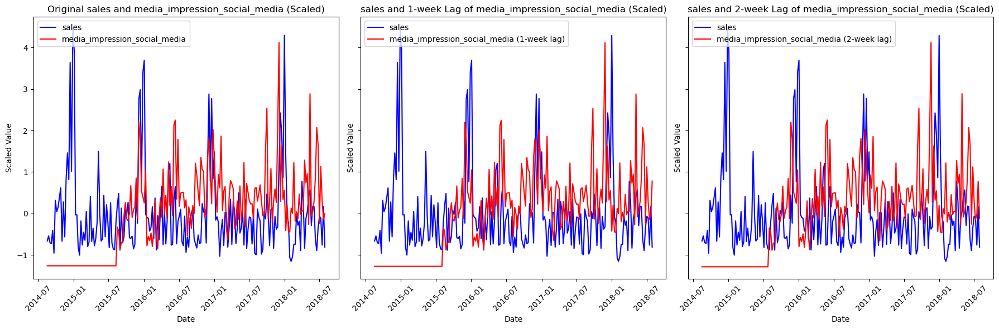

In [79]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_social_media')

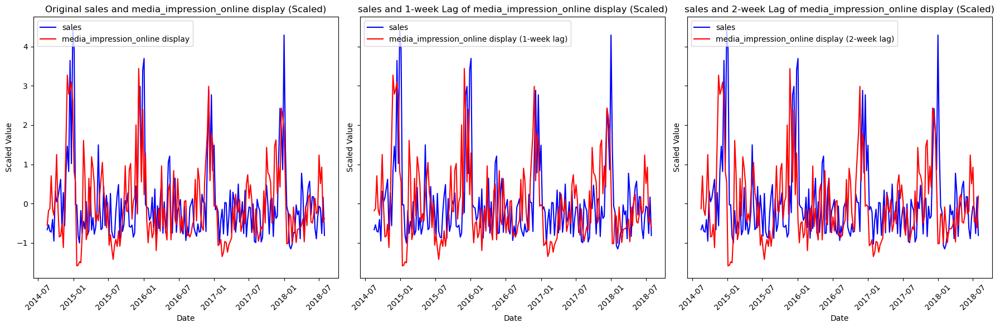

In [80]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_online display')

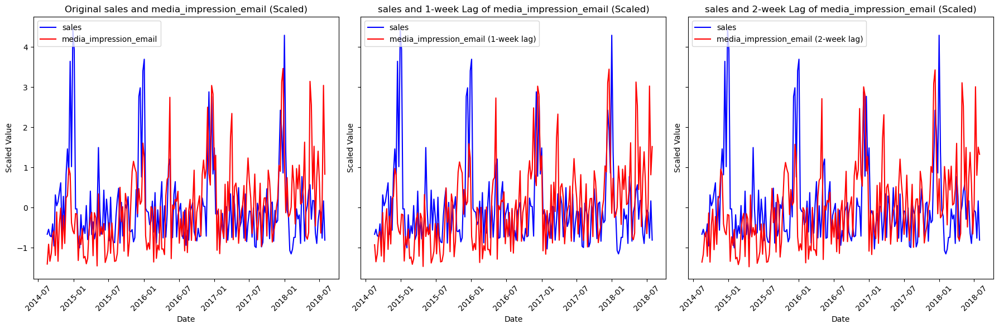

In [81]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_email')

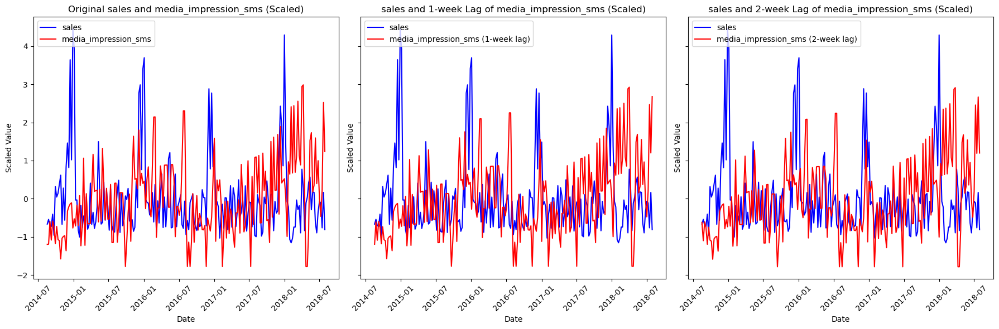

In [82]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_sms')

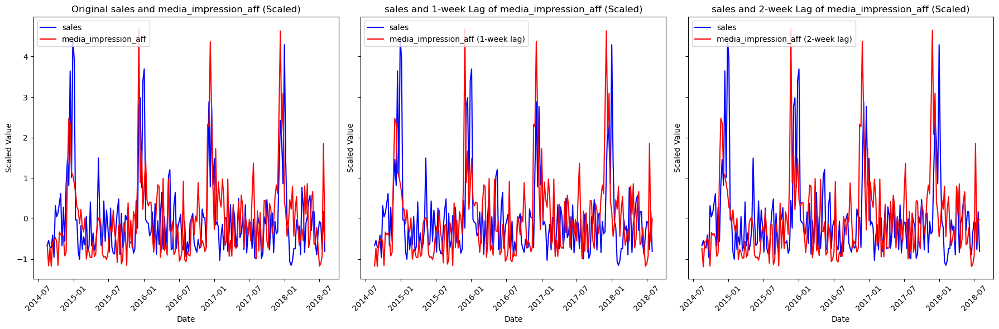

In [83]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_aff')

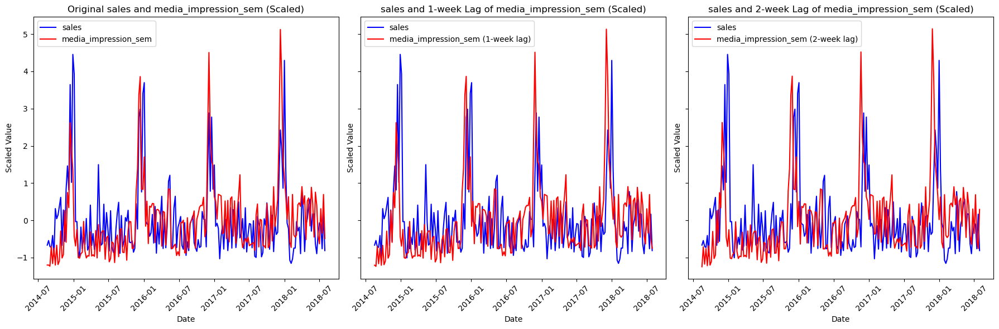

In [84]:
plot_line_charts_with_lags(mmm_df3, 'media_impression_sem')

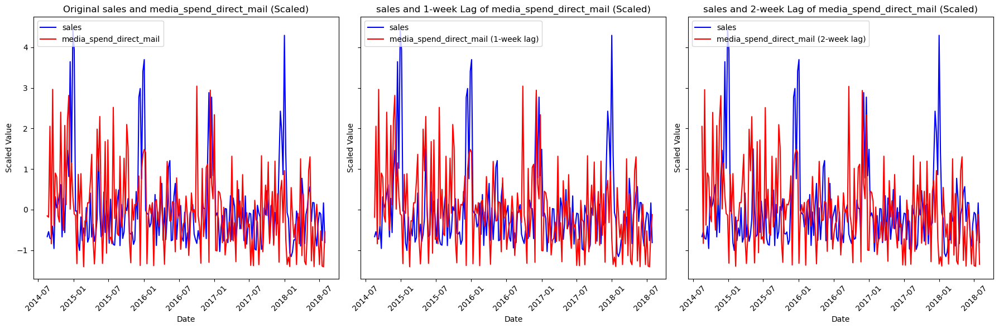

In [85]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_direct_mail')

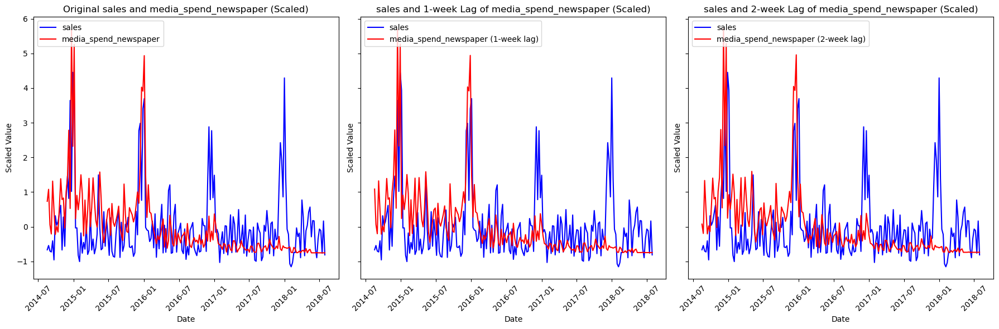

In [86]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_newspaper')

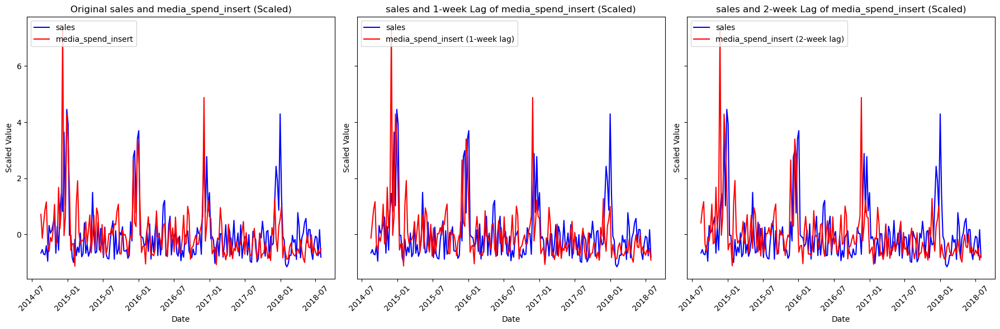

In [87]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_insert')

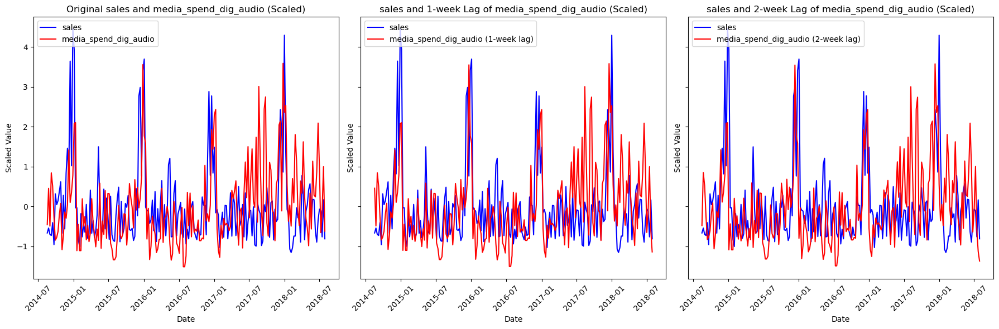

In [88]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_dig_audio')

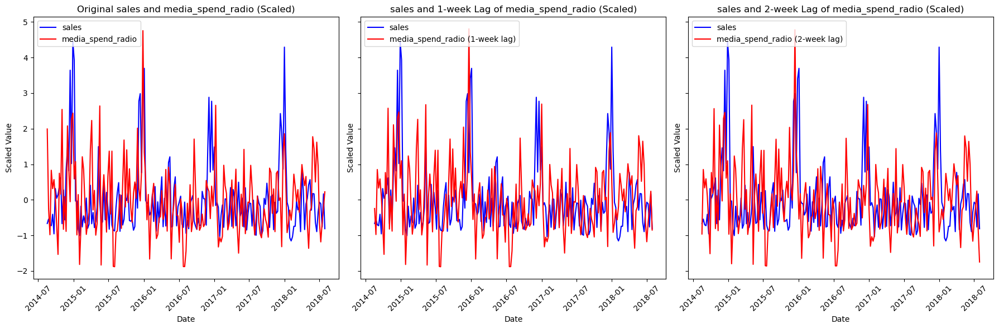

In [89]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_radio')

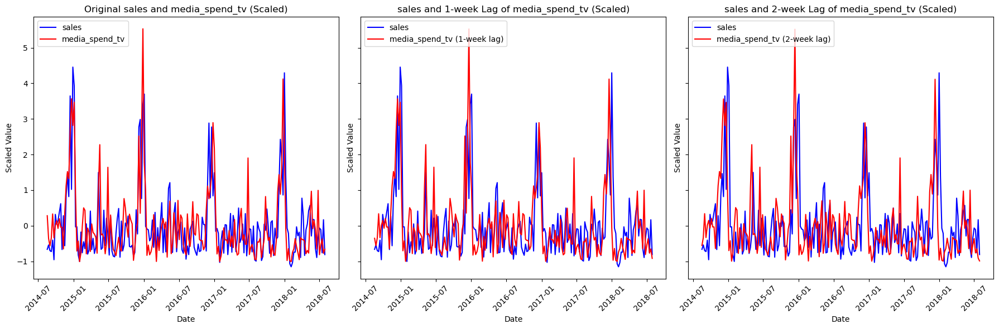

In [90]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_tv')

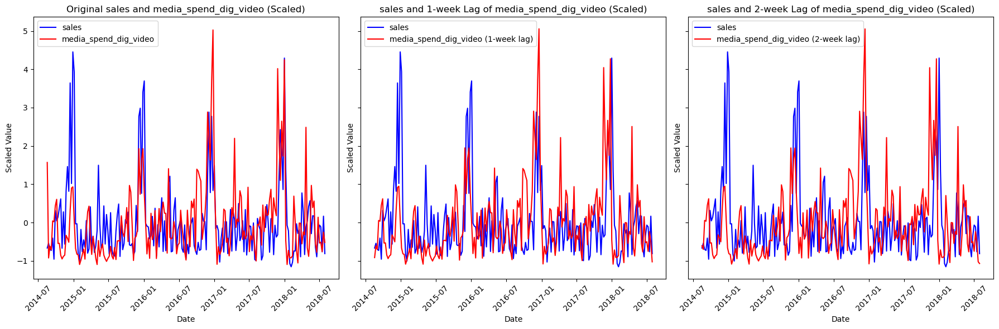

In [91]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_dig_video')

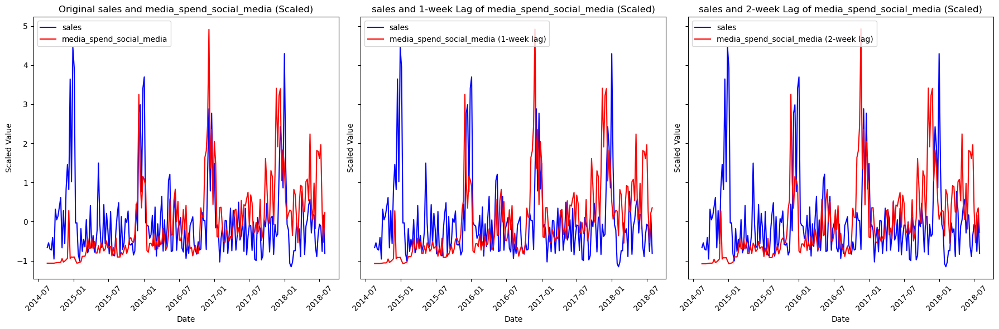

In [92]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_social_media')

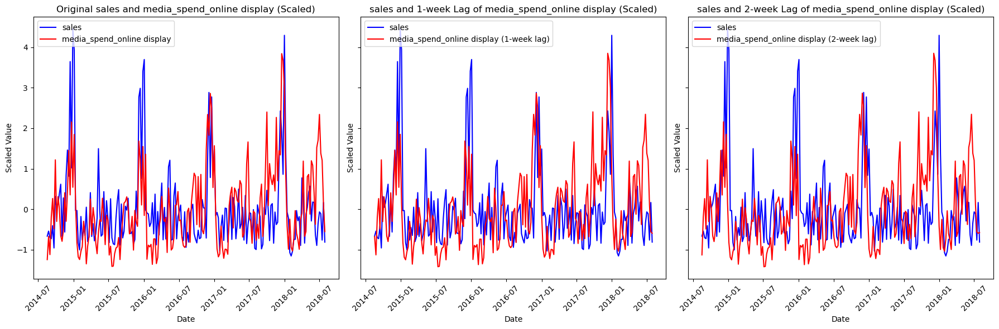

In [93]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_online display')

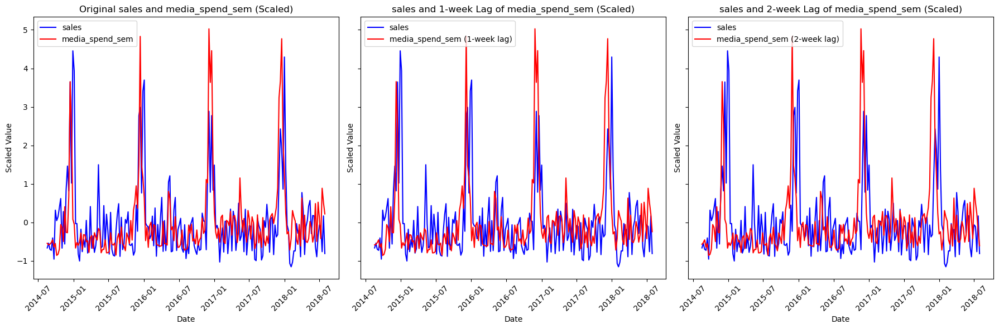

In [94]:
plot_line_charts_with_lags(mmm_df3, 'media_spend_sem')


In [33]:
mmm_df3.columns

Index(['week_start_date', 'year', 'quarter', 'period', 'week_in_year',
       'media_impression_direct_mail', 'media_impression_insert',
       'media_impression_newspaper', 'media_impression_dig_audio',
       'media_impression_radio', 'media_impression_tv',
       'media_impression_dig_video', 'media_impression_social_media',
       'media_impression_online display', 'media_impression_email',
       'media_impression_sms', 'media_impression_aff', 'media_impression_sem',
       'media_spend_direct_mail', 'media_spend_insert',
       'media_spend_newspaper', 'media_spend_dig_audio', 'media_spend_radio',
       'media_spend_tv', 'media_spend_dig_video', 'media_spend_social_media',
       'media_spend_online display', 'media_spend_sem', 'sales',
       'macro_econ_ics_all', 'macro_econ_gas_dpg', 'store_count',
       'markdown_discount_valadd_edw', 'markdown_discount_pdm',
       'hldy_black friday', 'hldy_christmas day', 'hldy_christmas eve',
       'hldy_cyber monday', 'hldy_day after 

## Modelling

In [95]:
"""

Run XGB Regressor

"""

independant_columns = [i for i in continuous_column+one_hot_encoded_columns+date_columns if 'week_start_date' not in i]
X = mmm_df2[independant_columns]
y = mmm_df2[target_column]

# Using the train test split function
X_train, X_test, y_train, y_test = train_test_split(
  X,y , random_state=104,test_size=0.25, shuffle=True)

print(X_train.shape,X_test.shape)

param_tuning = {
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7, 10],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.5, 0.7],
        'colsample_bytree': [0.5, 0.7],
        'n_estimators' : [100, 200, 500],
        'objective': ['reg:squarederror']
    }

xgb_model = XGBRegressor()

cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
random_search_le = RandomizedSearchCV(estimator=xgb_model,
                                    param_distributions=param_tuning,
                                    cv=cv,
                                    n_jobs=-2,
                                    verbose = 2,
                                    )

random_search_le.fit(X_train,y_train)

print(random_search_le.best_params_)

# Run new model for best params
new_model = XGBRegressor(random_state=6,**random_search_le.best_params_)

new_model.fit(X_train,y_train)

#predict on new model
prediction = new_model.predict(X_test)

rmse = mean_squared_error(y_test,prediction)
print("RMSE",np.sqrt(rmse)," Avg sales: ", np.mean(mmm_df2[target_column]))
print("MAPE", mean_absolute_percentage_error(y_test,prediction)*100, " R2", r2_score(y_test,prediction))


(156, 74) (53, 74)
Fitting 15 folds for each of 10 candidates, totalling 150 fits
{'subsample': 0.7, 'objective': 'reg:squarederror', 'n_estimators': 500, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 0.5}
RMSE 42785424.95649582  Avg sales:  sales    1.080543e+08
dtype: float64
MAPE 32.531855993737565  R2 0.21713146077138246


In [96]:
# Shap Analysis

shap_values_explainer = shap.TreeExplainer(model =new_model)
shap_values = shap_values_explainer.shap_values(X_train)

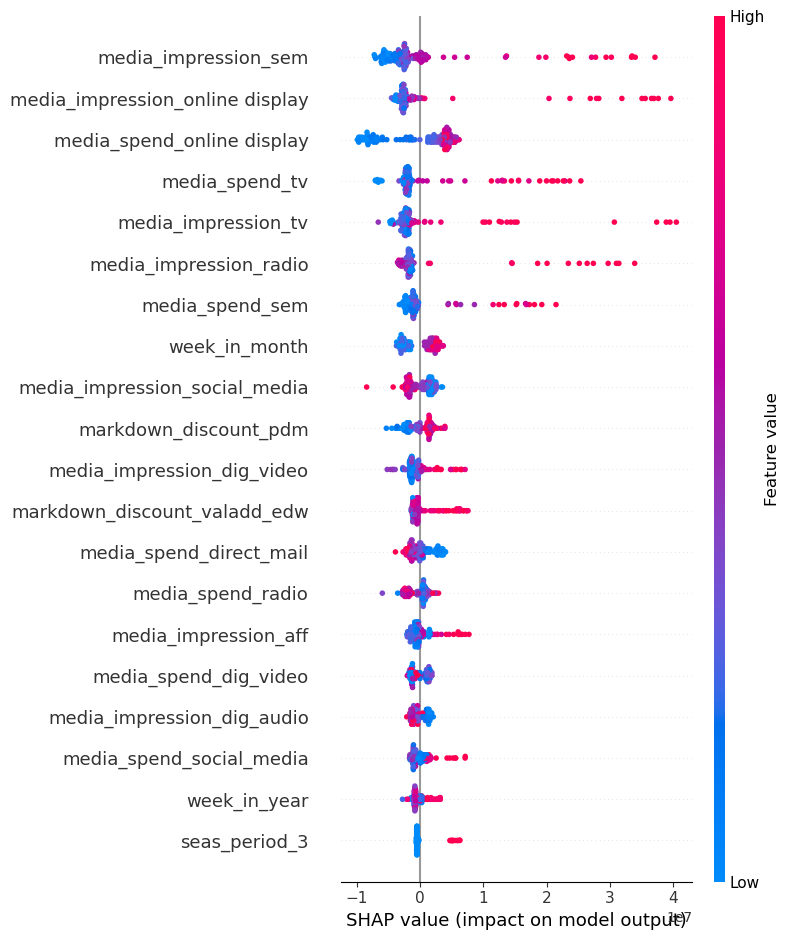

In [97]:
shap.initjs()
shap.summary_plot(shap_values, X_train)

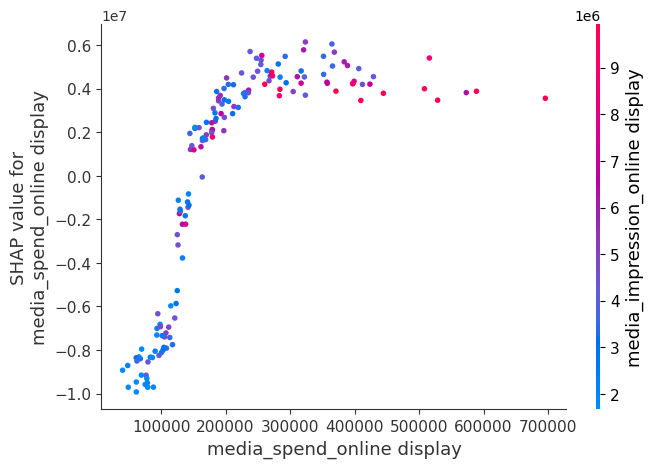

In [98]:
shap.dependence_plot('media_spend_online display', shap_values, X_train,interaction_index='media_impression_online display')

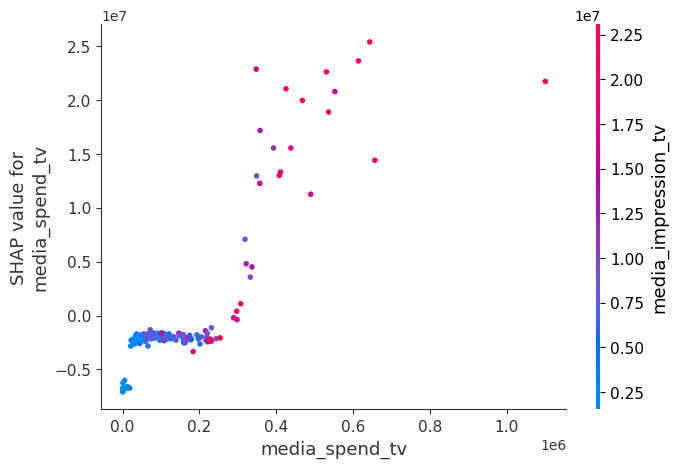

In [99]:
shap.dependence_plot('media_spend_tv', shap_values, X_train,interaction_index='media_impression_tv')